# Network Optimization
    Optimizing a network's virtual backbone using Graph Theory

## Import Tools

### Import Graph Tool Modules
    Specifically graph_tool main, draw and collection modules

In [31]:
import graph_tool.all
import graph_tool as gt
import graph_tool.draw
import graph_tool.collection
%config IPCompleter.greedy=True

### Import Other Required Modules
    These Modules include Matplotlib

In [27]:
import matplotlib as mpl

In [28]:
%matplotlib inline

In [29]:
import _pickle as pickle

In [5]:
from tqdm import tqdm_notebook as tqdm

In [35]:
from enum import Enum

In [36]:
from functools import reduce

## Algorithms

### Exact Exponential Algorithms

#### Minimum Dominating Set
    A bitmask approach to compute the minimum dominating set of a graph

In [7]:
def min_dominating_set_e1(graph):
    vertices = list(graph.vertices())
    vertex_neighbours_dict = {}

    for vertex in graph.vertices():
        vertex_neighbours = set(vertex.out_neighbors())
        vertex_neighbours.add(vertex)
        vertex_neighbours_dict[vertex] = vertex_neighbours

    min_dominating_set = set(vertices)

    for i in tqdm(range(2**(len(vertices)))):
        dominated = set()
        dominating = set()
        for j in range(len(vertices)):
            if not i&(1<<j):
                continue
            dominating.add(vertices[j])
            if len(dominating) >= len(min_dominating_set):
                break
            dominated = dominated.union(vertex_neighbours_dict[vertices[j]])
            if len(dominated) == len(vertices):
                min_dominating_set = dominating
                break
    
    dominated_property_map = graph.new_vertex_property("bool")
    dominated_property_map.set_value(0)
    for vertex in min_dominating_set:
        dominated_property_map[vertex] = 1
    
    return dominated_property_map

In [8]:
def min_dominating_set_e2(graph):
#https://ac.els-cdn.com/S0166218X11002393/1-s2.0-S0166218X11002393-main.pdf?_tid=2f975e0a-6fcd-4926-a7ac-f93b6265cf0a&acdnat=1534822962_d706d676ada4b2561924be5cb7565e4a

   

    vertices = graph.vertices()

    dominated_set = set()

    dominating_set = set()

    vertex_neighbours_dict = {}

    frequency_dict = {}

    # the set of vertices that dont need to be checked for dominater
    ignore_vertices = set()

    # the set of vertices that dont need to be checked 
    invisible_vertices = set()

    for vertex in graph.vertices():
        vertex_neighbours = set(vertex.out_neighbors())
        vertex_neighbours.add(vertex)
        vertex_neighbours_dict[vertex] = vertex_neighbours

    for vertex in graph.vertices():
        vertex_neighbours = set(vertex.out_neighbors())
        frequency_dict[vertex] = vertex_neighbours

    for vertex in vertex_neighbours_dict.keys():
        if len(set(vertex.out_neighbours())) == 1:
            dominated_set.add(vertex)
            dominating_set = dominating_set.union(set(vertex.out_neighbours()))

    for v,n in vertex_neighbours_dict.items():
        if v in ignore_vertices:
            continue
        for vertex, neighbours in vertex_neighbours_dict.items():
            if vertex == v:
                continue
            if neighbours.issubset(n):
                ignore_vertices.add(vertex)



    for vertex, neighbours in vertex_neighbours_dict.items():
        if vertex in invisible_vertices:
            continue
        neighbour_intersection = set()
        neighbour_intersection = neighbour_intersection.union(neighbours)
        for neighbour in neighbours:
            neighbour_intersection = neighbour_intersection.intersection(neighbour.out_neighbours())
        invisible_vertices = invisible_vertices.union(neighbour_intersection)

    frequency_2_vertices = set()

    for vertex, neighbours in frequency_dict.items():
        if len(neighbours) == 2:
            frequency_2_vertices.add(vertex)

    must_take_dominaters = set()
    pre_dominated = set()

    for vertex, neighbours in vertex_neighbours_dict.items():
        if vertex in pre_dominated:
            continue
        frequency_2_neighbours = neighbours.intersection(frequency_2_vertices)
        q = 0
        for v, n in vertex_neighbours_dict.items():
            if v == vertex:
                continue
            common_2_frequency = frequency_2_neighbours.intersection(n)
            if common_2_frequency:
                q += len(n) - len(common_2_frequency)
        if q < len(neighbours):
            must_take_dominaters.add(vertex)
            pre_dominated = pre_dominated.union(vertex_neighbours_dict[vertex])

    return ignore_vertices, invisible_vertices, must_take_dominaters, pre_dominated

#### Minimum Connected Dominating Set
    A bitmask approach to compute the minimum connected dominating set of a graph

In [9]:
def min_connected_dominating_set_e1(graph):
    vertices = list(graph.vertices())
    vertex_neighbours_dict = {}

    for vertex in graph.vertices():
        vertex_neighbours = set(vertex.out_neighbors())
        vertex_neighbours.add(vertex)
        vertex_neighbours_dict[vertex] = vertex_neighbours

    min_dominating_set = set(vertices)

    for i in tqdm(range(2**(len(vertices)))):
        dominated = set()
        dominating = set()
        for j in range(len(vertices)):
            if not i&(1<<j):
                continue
            if j>0 and not vertices[j] in dominated:
                continue
                
            dominating.add(vertices[j])
            
            if len(dominating) >= len(min_dominating_set):
                break
            dominated = dominated.union(vertex_neighbours_dict[vertices[j]])
            if len(dominated) == len(vertices):
                min_dominating_set = dominating
                break
    
    dominated_property_map = graph.new_vertex_property("bool")
    dominated_property_map.set_value(0)
    for vertex in min_dominating_set:
        dominated_property_map[vertex] = 1
    
    return dominated_property_map

### Heuristic Approximate Algorithms

#### Minimum Dominating Set
    A Greedy approach for computing the minimum dominating set of an undirected graph

In [30]:
def helper_min_dominating_set_h1(graph):
#     import pdb; pdb.set_trace()
    dominated_set = set()
    dominating_set = set()
    vertex_neighbours_dict = {}
#     total_vertices = len(graph.vertices())
    
    for vertex in graph.vertices():
        vertex_neighbours = set(vertex.all_neighbors())
        vertex_neighbours.add(vertex)
        vertex_neighbours_dict[vertex] = vertex_neighbours
    
#     print(vertex_neighbours_dict)
    
    def get_max_potential_vertex():
        max_potential = 0
        max_p_vertex = None
        for vertex, neighbours in vertex_neighbours_dict.items():
            if len(neighbours) > max_potential:
                max_potential = len(neighbours)
                max_p_vertex = vertex
        return max_p_vertex
    
    while vertex_neighbours_dict:
        current_vertex = get_max_potential_vertex()
#         print("The current vertex is", current_vertex)
#         print("The current dominated set is", dominated_set)
#         print("The neighbours not dominated yet for the current vertex is", vertex_neighbours_dict[current_vertex])
        current_vertex_neighbours = vertex_neighbours_dict.pop(current_vertex, None)
#         print("Recheck", current_vertex_neighbours)
        dominated_set = dominated_set.union(current_vertex_neighbours)
        dominating_set.add(current_vertex)
        to_delete = set()
        for vertex, neighbours in vertex_neighbours_dict.items():
            neighbours = neighbours.difference(current_vertex_neighbours)
            vertex_neighbours_dict[vertex] = neighbours
            if not neighbours:
                to_delete.add(vertex)
        for vertex in to_delete:
            vertex_neighbours_dict.pop(vertex)
        
    return dominating_set    

In [82]:
def min_dominating_set_greedy_reverse(graph):
#     assert type(graph) is gt.Graph
    
    count_dict = {}
    

    
    def hit(vertex):
#         global count_dict
        count_dict[vertex] = count_dict.get(vertex,0)+1
    
    #hit self and neighbours
    def hit_san(vertex):
#         global count_dict
        hit(vertex)
        for v in vertex.out_neighbours():
            hit(v)
    
    def mock_remove(vertex):
#         global count_dict
        for v in vertex.all_neighbours():
            count_dict[v] = count_dict.get(v)-1
        
        count_dict[vertex] = count_dict.get(vertex)-1
        
    def valid():
#         global count_dict
        for v in count_dict.values():
            if v<=0:
                return False
        return True
    
    dominators = set()
    all_vertices = list(graph.vertices())
    for vertex in all_vertices:
        hit_san(vertex)
        
#     vertices_with_neighbour_count
    sorted(all_vertices, key=lambda x: len(list(x.all_neighbours())))
    
    for vertex in all_vertices:
        mock_remove(vertex)
        if not valid():
            hit_san(vertex)
            dominators.add(vertex)
    
    return dominators

In [85]:
def min_dominating_set_greedy_vote(graph):
    
    dominated = set()
    dominators = set()
    all_vertices = set(graph.vertices())
    votes = dict(list(map(lambda x:(x,1/(1+len(list(x.all_neighbours())))),all_vertices)))
    weights = dict(votes)
    
    def adjust_weights(vertex):
        weights[vertex] = 0
        
        for v in list(vertex.all_neighbours()):
            if weights[v]<=0:
                continue
            if not vertex in dominated:
                weights[v] -= votes[vertex]
            if not v in dominated:
                dominated.add(v)
                weights[v] -= votes[v]
                for n_v in list(v.all_neighbours()):
                    if weights[n_v]>0:
                        weights[n_v] -= votes[v]
        dominated.add(vertex)
    
    def get_vertex():
        maxv,maxw = None,0 
        for v,w in weights.items():
            if w>maxw:
                maxv = v
                maxw = w
        
        if maxw <=0:
            return None
        return maxv
    
    for v in all_vertices:
        for v_n in list(v.all_neighbours()):
            weights[v]+=votes[v_n]
    
    while True:
        v = get_vertex()
        if v is None:
            break
        dominators.add(v)
        adjust_weights(v)
    
    return dominators
    
    

In [86]:
def min_dominating_set_h1(graph, funct=helper_min_dominating_set_h1,verbose=True):
    dominating_set = funct(graph)
    if verbose:
        print("Size:" ,len(dominating_set))
    dominated_property_map = graph.new_vertex_property("bool")
    dominated_property_map.set_value(0)
    for vertex in dominating_set:
        dominated_property_map[vertex] = 1
    
    return dominated_property_map

helper_algo = min_dominating_set_h1

#### Minimum Connected Dominating Set
    A Greedy approach to compute the minimum connected dominating set of a graph

In [12]:
def helper_min_connected_dominating_set_h1(graph):
    dominated_set = set()
    dominating_set = set()
    vertex_neighbours_dict = {}
    possible_vertex_options = set()
    
    for vertex in graph.vertices():
        vertex_neighbours = set(vertex.out_neighbors())
        vertex_neighbours.add(vertex)
        vertex_neighbours_dict[vertex] = vertex_neighbours
    
    
    def get_max_potential_vertex(iterable):
        max_potential = 0
        max_p_vertex = None
        for vertex in iterable:
            neighbours = vertex_neighbours_dict.get(vertex, [])
            if len(neighbours) > max_potential:
                max_potential = len(neighbours)
                max_p_vertex = vertex
        return max_p_vertex
    
    first_vertex = get_max_potential_vertex(vertex_neighbours_dict.keys())
    possible_vertex_options.add(first_vertex)
    
    
    
    while possible_vertex_options:
        current_vertex = get_max_potential_vertex(possible_vertex_options)
        if not current_vertex:
            break
        possible_vertex_options.remove(current_vertex)
        to_delete = set()
        current_vertex_neighbours = vertex_neighbours_dict.pop(current_vertex, set())
        possible_vertex_options = possible_vertex_options.union(current_vertex_neighbours)
        dominated_set = dominated_set.union(current_vertex_neighbours)
        dominating_set.add(current_vertex)
        for vertex, neighbours in vertex_neighbours_dict.items():
            neighbours = neighbours.difference(current_vertex_neighbours)
            vertex_neighbours_dict[vertex] = neighbours
            if not neighbours:
                to_delete.add(vertex)
        for vertex in to_delete:
            vertex_neighbours_dict.pop(vertex)
        

    return dominating_set
    

In [13]:
def min_connected_dominating_set_h1(graph):
    dominating_set = helper_min_connected_dominating_set_h1(graph)
    dominated_property_map = graph.new_vertex_property("bool")
    dominated_property_map.set_value(0)
    for vertex in dominating_set:
        dominated_property_map[vertex] = 1
    
    return dominated_property_map


### Miscellaneous Algorithms

In [14]:
#### Convert set to property map

In [15]:
def get_map(graph, function):
    dominating_set = function(graph)
    dominated_property_map = graph.new_vertex_property("bool")
    dominated_property_map.set_value(0)
    for vertex in dominating_set:
        dominated_property_map[vertex] = 1
    
    return dominated_property_map

#### Algorithm to check for Unique Dominating Set

In [16]:
# inputs: graph, dominating set
# for each vertex in the graph, find its neighbours in the dominating set
# for vertices (not belonging to the dominating set) with a single neighbour in the Dominating Set, update the corresponding neighbour
# check whether all vertices of the dominating set have atleast 2 updates
# return condition

In [17]:
def check_unique_dominating_set(graph, dominating_set):
    
    vertices = set(graph.vertices())
    dominated_vertices = vertices.difference(set(dominating_set))
    count = {}
    for v in dominating_set:
        count[v] = 0
    for v in dominated_vertices:
        neighbours = set(v.out_neighbours())
        dominators = list(neighbours.intersection(dominating_set))
        if len(dominators) == 1:
            count[dominators[0]] += 1
    
    for k,v in count.items():
        if v<2:
            return False
    
    return True

### Helper Tool

In [18]:
class Algorithms(Enum):
    MIN_DOMINATING_SET =1
    MIN_CONNECTED_DOMINATING_SET =2
    MIN_WEIGHT_DOMINATING_SET =3
    MIN_WEIGHT_CONNECTED_DOMINATING_SET =4

In [19]:
def compute(graph, algorithm, exact=False):
    
    if exact:
        return Exact.compute(graph, algorithm)
    if not exact:
        return Heuristic.compute(graph, algorithm)
    

In [20]:
class Exact:
    
    algorithm_dict = {}
    algorithm_dict[Algorithms.MIN_CONNECTED_DOMINATING_SET] = min_connected_dominating_set_e1
    algorithm_dict[Algorithms.MIN_DOMINATING_SET] = min_dominating_set_e1
    def compute(graph, algorithm):
        return Exact.algorithm_dict[algorithm](graph)

In [21]:
class Heuristic:
    
    algorithm_dict = {}
    algorithm_dict[Algorithms.MIN_CONNECTED_DOMINATING_SET] = min_connected_dominating_set_h1
    algorithm_dict[Algorithms.MIN_DOMINATING_SET] = min_dominating_set_h1
    def compute(graph, algorithm):
        return Heuristic.algorithm_dict[algorithm](graph)

In [22]:
class ConstantFactor:
    pass

In [23]:
class Genetic:
    pass

In [24]:
class ArtificialBeeColony:
    pass

## Sample Graphs

### Library Collections

#### List of available graphs

In [40]:
list(gt.collection.data.keys())

['adjnoun',
 'as-22july06',
 'astro-ph',
 'celegansneural',
 'cond-mat',
 'cond-mat-2003',
 'cond-mat-2005',
 'dolphins',
 'email-Enron',
 'football',
 'hep-th',
 'karate',
 'lesmis',
 'netscience',
 'pgp-strong-2009',
 'polblogs',
 'polbooks',
 'power',
 'serengeti-foodweb']

##### Visualise Graph

In [41]:
# select graph from library collection
graph = gt.collection.data["football"]

In [42]:
# uniform position 
pos = gt.draw.sfdp_layout(graph)

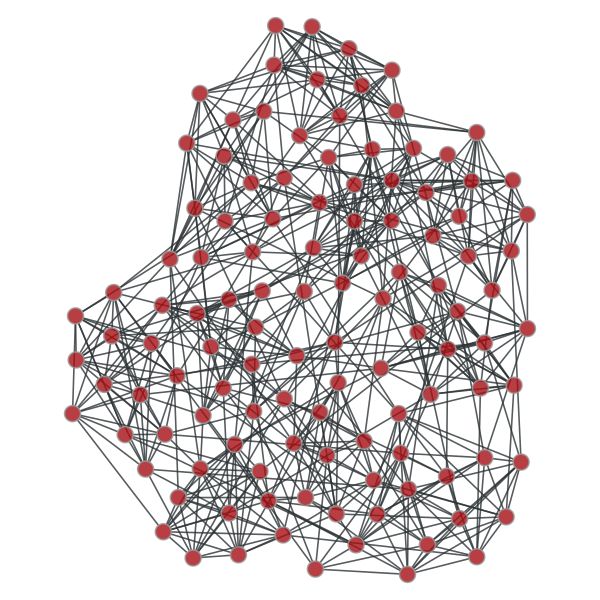

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x131dfbef0, at 0x131dfb128>

In [43]:
gt.draw.graph_draw(graph, pos=pos)

##### Minimum Dominating Set

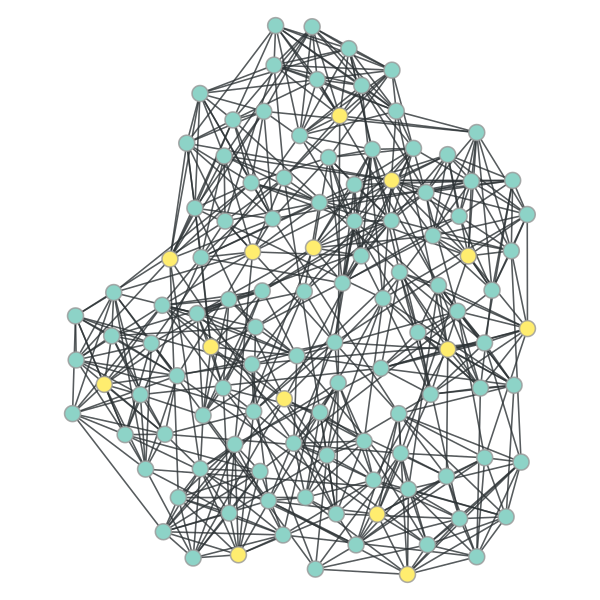

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x131dfbef0, at 0x131dfb128>

In [59]:
gt.draw.graph_draw(graph, vertex_fill_color=compute(graph, Algorithms.MIN_DOMINATING_SET, exact=False ), pos=pos)

Size: 17


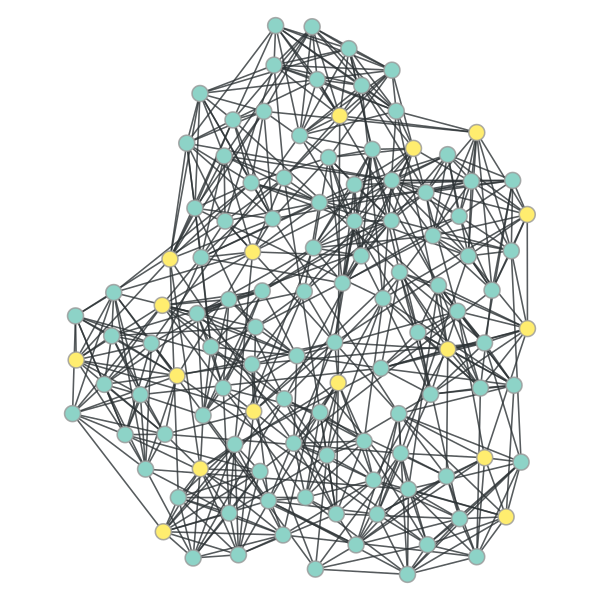

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x131dfbef0, at 0x131dfb128>

In [62]:
gt.draw.graph_draw(graph, vertex_fill_color=helper_algo(graph,helper_min_connected_dominating_set_h1), pos=pos)

Size: 17


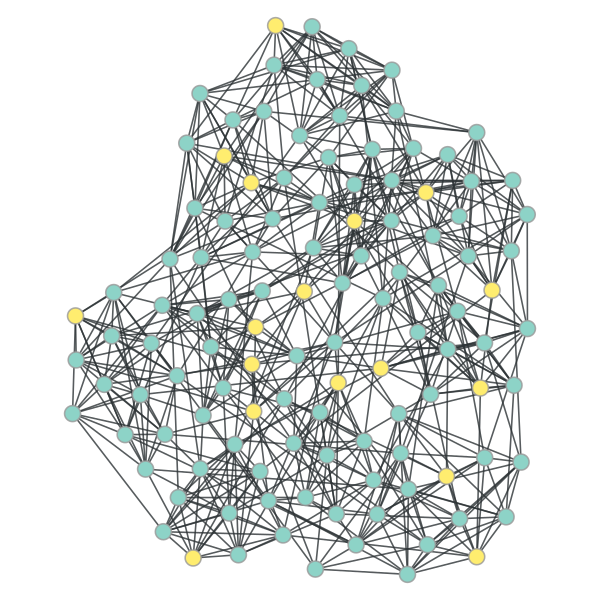

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x131dfbef0, at 0x131dfb128>

In [63]:
gt.draw.graph_draw(graph, vertex_fill_color=helper_algo(graph, min_dominating_set_greedy_reverse), pos=pos)

##### Minimum Connected Dominating Set

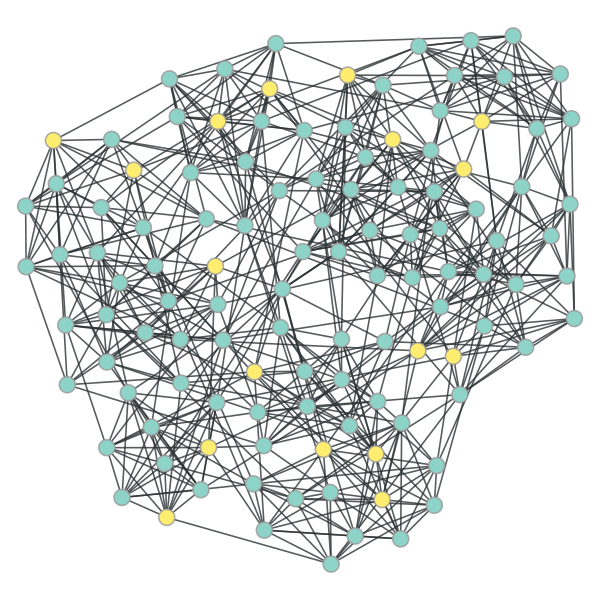

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf1ff080, at 0x7fcddf204e10>

In [30]:
gt.draw.graph_draw(graph, vertex_fill_color=compute(graph, Algorithms.MIN_CONNECTED_DOMINATING_SET, exact=False ))

### Custom Graphs

#### Lattice Graph

##### Visualize Graph

In [31]:
graph = gt.generation.lattice([5,5,5], periodic=False)

In [32]:
pos = gt.draw.sfdp_layout(graph)

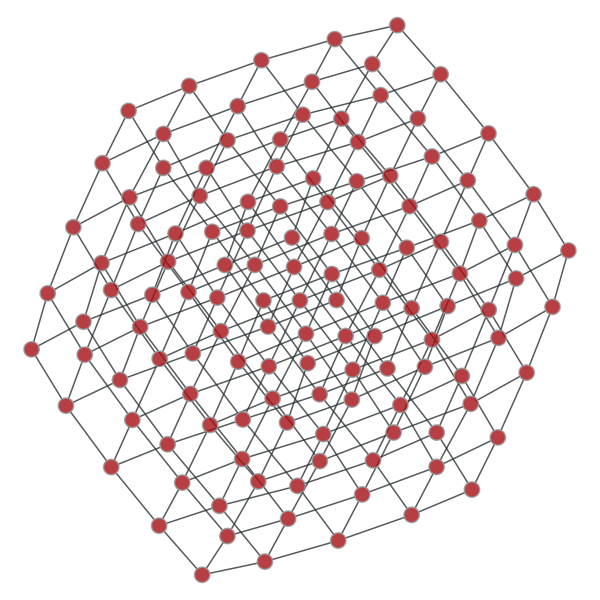

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf204f60, at 0x7fcddf2048d0>

In [33]:
gt.draw.graph_draw(graph, pos=pos)

##### Minimum Dominating Set

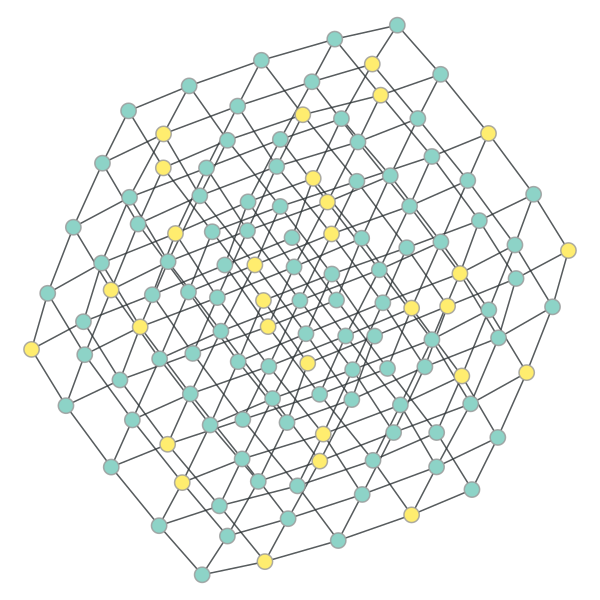

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf204f60, at 0x7fcddf2048d0>

In [34]:
gt.draw.graph_draw(graph, pos=pos, vertex_fill_color=compute(graph, Algorithms.MIN_DOMINATING_SET, exact=False ) )

##### Minimum Connected Dominating Set

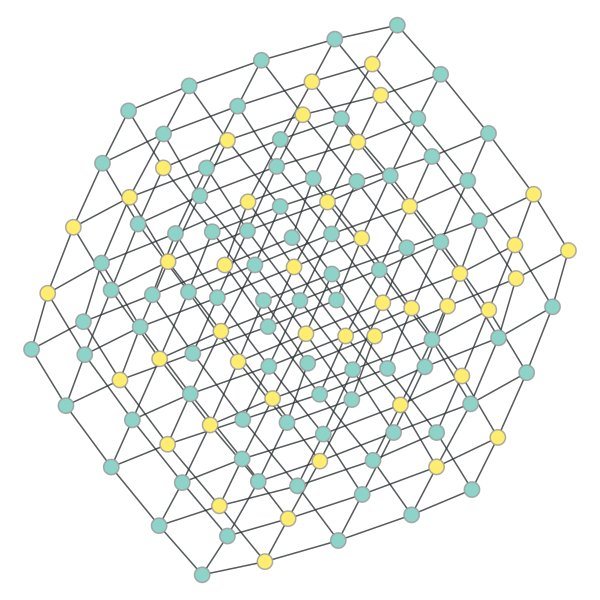

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf204f60, at 0x7fcddf2048d0>

In [35]:
gt.draw.graph_draw(graph, pos=pos, vertex_fill_color=compute(graph, Algorithms.MIN_CONNECTED_DOMINATING_SET, exact=False ))

#### Random Graph

In [36]:
# limit 10
from random import random as random_number
def random_degree_sampler():
    return int((random_number()*10) +1)

##### Visualize Graph

In [37]:
graph = gt.generation.random_graph(N=200, deg_sampler=random_degree_sampler, directed=False, verbose=True )

In [38]:
pos = gt.draw.sfdp_layout(graph)

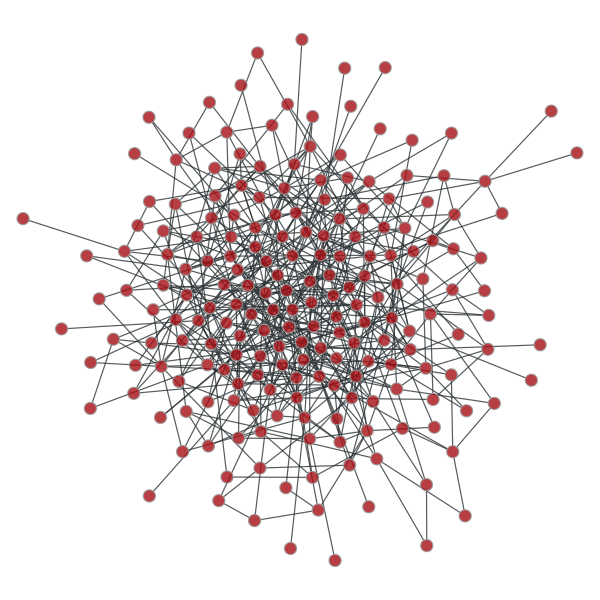

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf194128, at 0x7fcddf194048>

In [39]:
gt.draw.graph_draw(graph, pos=pos)

##### Minimum Dominating Set

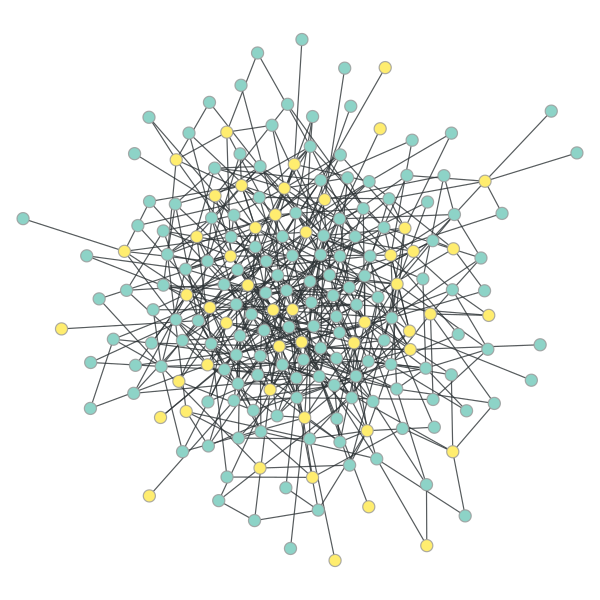

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf194128, at 0x7fcddf194048>

In [40]:
gt.draw.graph_draw(graph, pos=pos, vertex_fill_color=compute(graph, Algorithms.MIN_DOMINATING_SET, exact=False ))

##### Minimum Connected Dominating Set

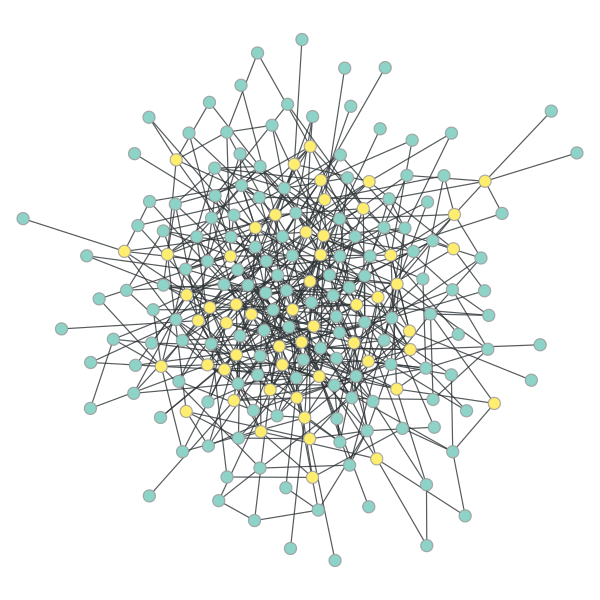

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf194128, at 0x7fcddf194048>

In [41]:
gt.draw.graph_draw(graph, pos=pos, vertex_fill_color=compute(graph, Algorithms.MIN_CONNECTED_DOMINATING_SET, exact=False ))

#### Circular Graph

##### Visualize Graph

In [42]:
graph = gt.generation.circular_graph(N=2400, directed=False, k=1)

In [43]:
pos = gt.draw.sfdp_layout(graph)

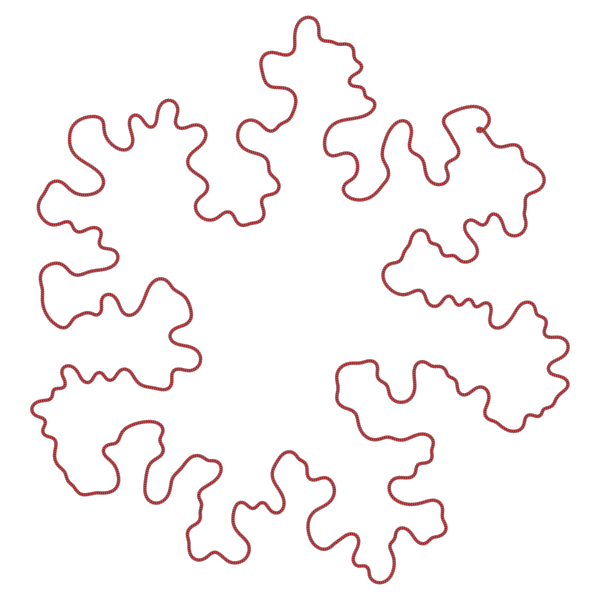

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf194550, at 0x7fcddf204c18>

In [44]:
gt.draw.graph_draw(graph, pos=pos)

##### Minimum Dominating Set

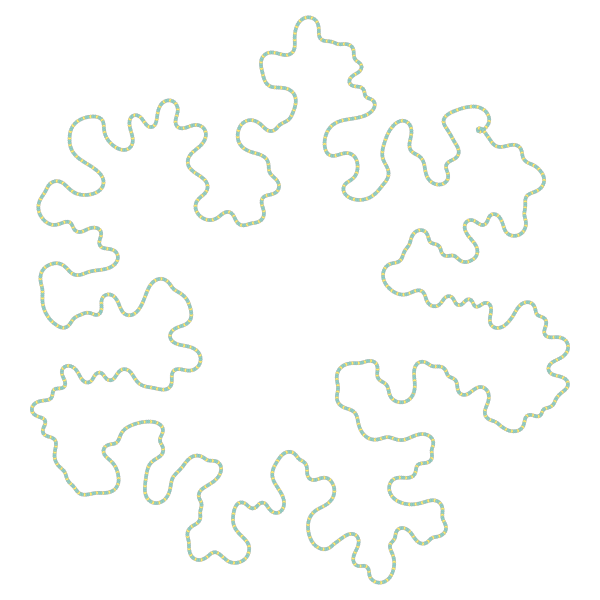

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf194550, at 0x7fcddf204c18>

In [45]:
gt.draw.graph_draw(graph, pos=pos, vertex_fill_color=compute(graph, Algorithms.MIN_DOMINATING_SET, exact=False ))

In [46]:
# gt.draw.GraphWidget(graph, pos=pos, vertex_fill_color=min_dominating_set(graph))

##### Minimum Connected Dominating Set

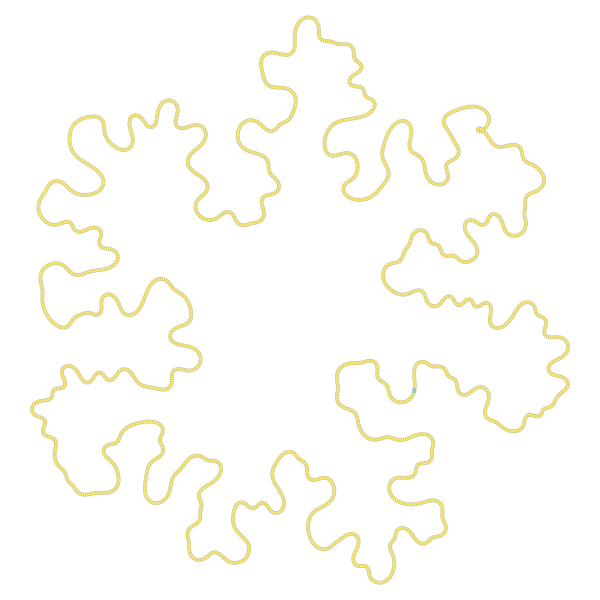

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf194550, at 0x7fcddf204c18>

In [47]:
gt.draw.graph_draw(graph, pos=pos, vertex_fill_color=compute(graph, Algorithms.MIN_CONNECTED_DOMINATING_SET, exact=False ))

#### Triangular Graph

In [48]:
# with open('simple_triangular_undirected_graph.pickle', 'wb') as f:
#     pickle.dump(graph, f)

In [49]:
with open('simple_triangular_undirected_graph.pickle', 'rb') as f:
    graph = pickle.load(f)

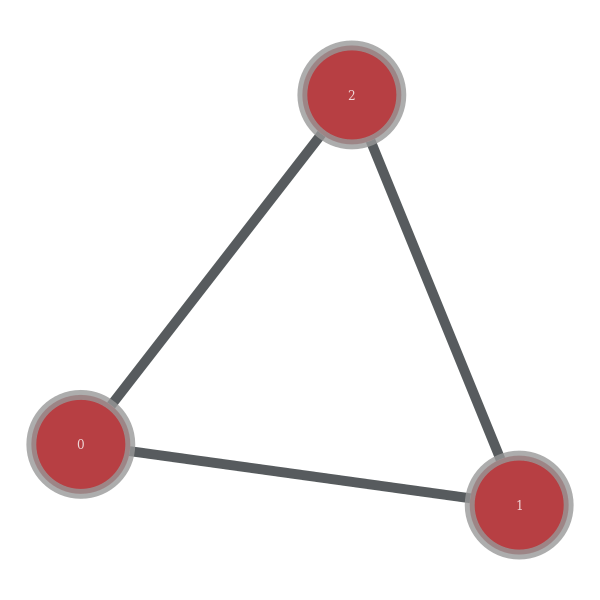

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf1c7748, at 0x7fcddf1c7128>

In [50]:
gt.draw.graph_draw(graph, vertex_text=graph.vertex_index)

### Counter Example Graphs

#### Greedy Heuristic Algorithms

In [51]:
# with open('counter_example_greedy_heuristic.pickle', 'wb') as f:
#     pickle.dump(save_counter_example_graph_1, f)

In [52]:
with open('counter_example_greedy_heuristic.pickle', 'rb') as f:
    graph = pickle.load(f)

In [53]:
pos = gt.draw.sfdp_layout(graph)

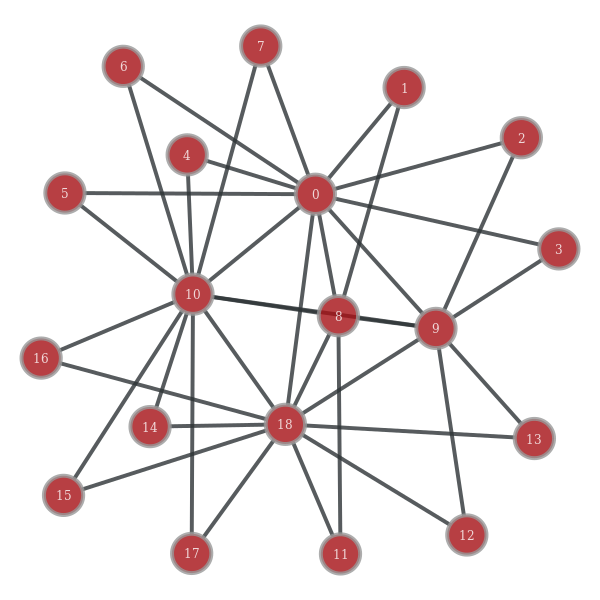

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf1c7be0, at 0x7fcddf1c7080>

In [54]:
gt.draw.graph_draw(graph,  vertex_text=graph.vertex_index, pos=pos)

##### Approximate Algorithm Results

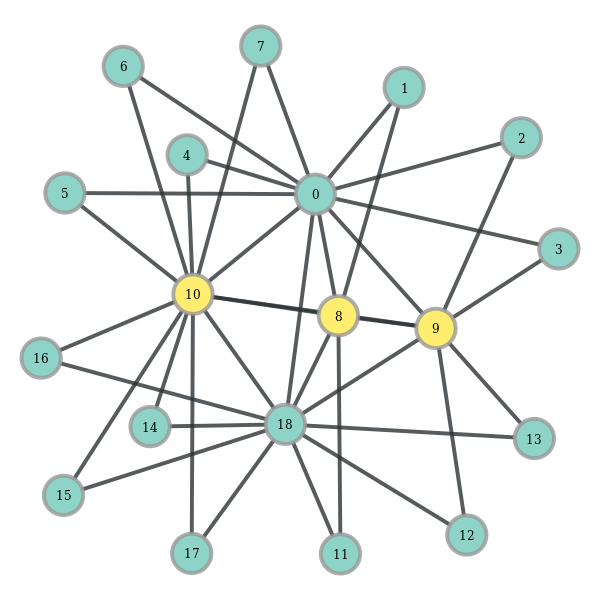

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf1c7be0, at 0x7fcddf1c7080>

In [55]:
gt.draw.graph_draw(graph, vertex_fill_color=compute(graph, Algorithms.MIN_DOMINATING_SET, exact=False ), vertex_text=graph.vertex_index, pos=pos)

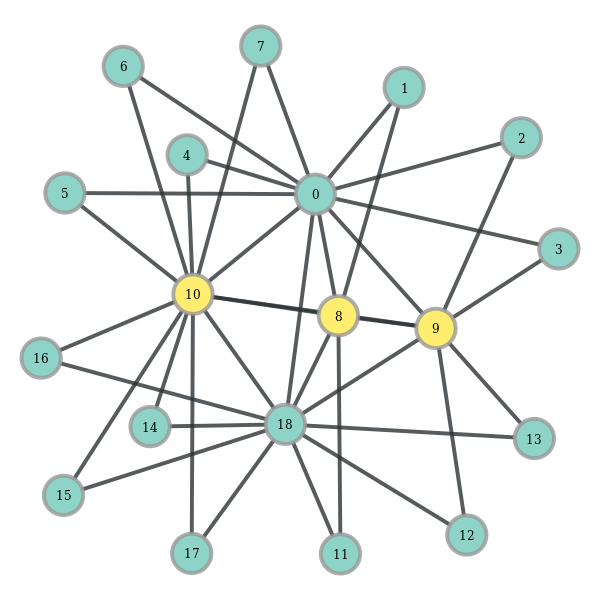

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf1c7be0, at 0x7fcddf1c7080>

In [56]:
gt.draw.graph_draw(graph,vertex_fill_color=compute(graph, Algorithms.MIN_CONNECTED_DOMINATING_SET, exact=False ), vertex_text=graph.vertex_index, pos=pos)

##### Exact Algorithm Results

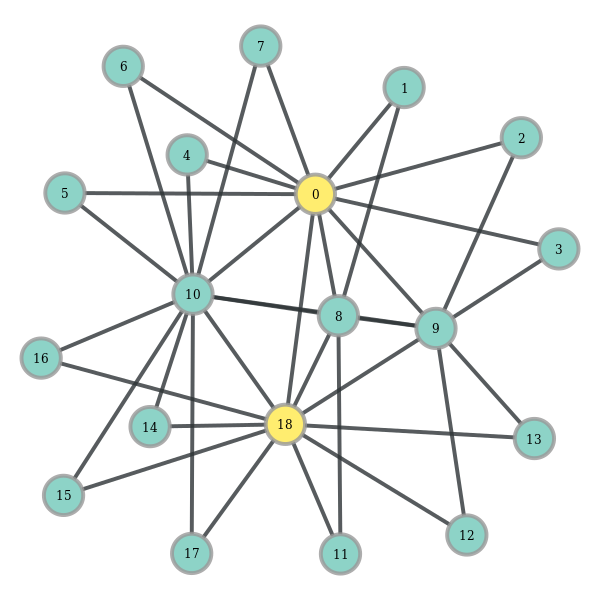

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf1c7be0, at 0x7fcddf1c7080>

In [57]:
gt.draw.graph_draw(graph, vertex_fill_color=compute(graph, Algorithms.MIN_DOMINATING_SET, exact=True), vertex_text=graph.vertex_index, pos=pos)

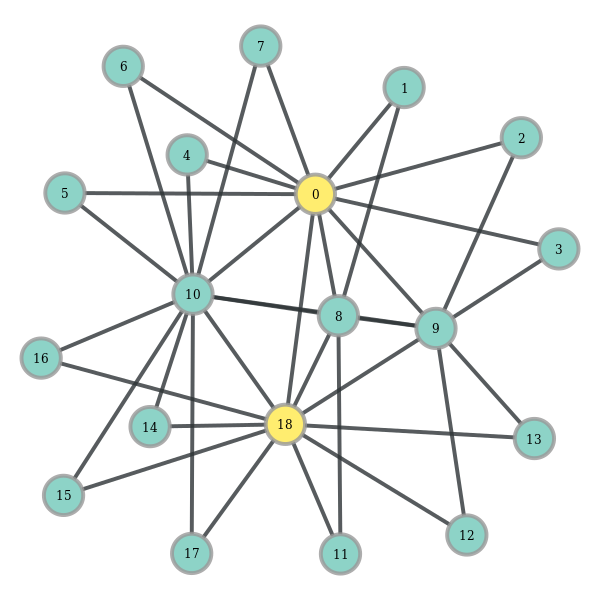

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf1c7be0, at 0x7fcddf1c7080>

In [58]:
gt.draw.graph_draw(graph, vertex_fill_color=compute(graph, Algorithms.MIN_CONNECTED_DOMINATING_SET, exact=True), vertex_text=graph.vertex_index, pos=pos)

In [59]:
gt.draw.interactive_window(graph, pos=pos,vertex_fill_color=compute(graph, Algorithms.MIN_DOMINATING_SET, exact=True ), vertex_text=graph.vertex_index )

(<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf1c7be0, at 0x7fcddf1c7080>,
 <PropertyMap object with key type 'Vertex' and value type 'bool', for Graph 0x7fcddf1c7be0, at 0x7fcddf194e10>)

In [60]:
gt.draw.cairo_draw??

#### Test Graph

In [61]:
graph = gt.Graph(directed=False)

In [62]:
graph.add_vertex(3)

<generator object Graph.add_vertex.<locals>.<genexpr> at 0x7fcddf1c4200>

In [63]:
graph.add_edge_list([(0,1),(1,2),(0,2)])

In [64]:
pos = gt.draw.planar_layout(graph)

In [65]:
graph.add_edge_list([(0,1),(1,2),(2,5),(5,7),(7,4),(4,6),(1,4),(1,3),(3,6)])

In [66]:
gt.draw.interactive_window(graph, pos=pos, vertex_text=graph.vertex_index )

(<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddf1c7f98, at 0x7fcddf1c7fd0>,
 <PropertyMap object with key type 'Vertex' and value type 'bool', for Graph 0x7fcddf1c7f98, at 0x7fcddd90e5c0>)

In [67]:
graph.add_edge(3,2)

<Edge object with source '3' and target '2' at 0x7fcddf209e40>

In [68]:
graph.add_vertex()

<Vertex object with index '8' at 0x7fcddf1fb4b0>

In [69]:
check_unique_dominating_set(graph, helper_min_dominating_set_h1(graph))

False

## Optimized Algorithm

In [70]:
vertex_rules={}

In [114]:
def preprocess(graph):
    # Apply all rules
    global vertex_rules
    vertex_rules = {}
    dominated_property_map = graph.new_vertex_property("int")
    rules_1_2(graph, dominated_property_map)
    rule3(graph, dominated_property_map)
    rule4(graph, dominated_property_map)
#     print("PREPROCESSED")
    count = 0
    c = 0
    for i in dominated_property_map:
        if i == 0:
            count += 1
        c += 1
#     print(cc count)
    return dominated_property_map

In [91]:
# for graph_k in gt.collection.data.keys():
#     compute(gt.collection.data[graph_k],Algorithms.MIN_DOMINATING_SET,exact=False)

In [92]:
graph_tool.collection.data.items()

dict_items([('football', <Graph object, undirected, with 115 vertices and 613 edges at 0x131dfbef0>), ('adjnoun', <Graph object, undirected, with 112 vertices and 425 edges at 0x10ee63f60>), ('as-22july06', <Graph object, undirected, with 22963 vertices and 48436 edges at 0x10ee63438>), ('astro-ph', <Graph object, undirected, with 16706 vertices and 121251 edges at 0x10dedd400>), ('celegansneural', <Graph object, directed, with 297 vertices and 2359 edges at 0x10dedd550>), ('cond-mat', <Graph object, undirected, with 16726 vertices and 47594 edges at 0x10ee590f0>), ('cond-mat-2003', <Graph object, undirected, with 31163 vertices and 120029 edges at 0x10ee59470>), ('cond-mat-2005', <Graph object, undirected, with 40421 vertices and 175693 edges at 0x10ee597f0>), ('dolphins', <Graph object, undirected, with 62 vertices and 159 edges at 0x10ee59b70>), ('email-Enron', <Graph object, undirected, with 36692 vertices and 183831 edges at 0x10ee59ef0>), ('hep-th', <Graph object, undirected, wit

In [93]:
# preprocess(graph)

In [94]:
def assign(property_map, vertex, value, rule):
    try: 
        assert property_map[vertex]==0 or property_map[vertex] == value
    except AssertionError as e:
        if value == 3 and property_map[vertex] == 2:
            value = 2
#         else:
#             print("Currently: ", property_map[vertex], ", new value: ", value)
            
    property_map[vertex] = value
    vertex_rules[vertex] = rule

In [95]:
def rules_1_2(graph, property_map):
    #import pdb; pdb.set_trace()
    vertices = graph.vertices()
    for vertex in vertices:
        #assert type(vertex) is graph_tool.Vertex
        dominators = list(vertex.all_neighbors())
        if len(dominators)==1:
            # 1 is for confirmed dominators
            assign(property_map, dominators[0],1, "1-2")
            # 2 is for confirmed dominated, hence will never be dominators either
            assign(property_map, vertex, 2,"1-2")

In [96]:
def rule3(graph, property_map):
    #import pdb; pdb.set_trace()
    vertices = graph.vertices()
    for vertex in vertices:
        # add or == 2 and everywhere else
        if property_map[vertex] == 3:
            continue
        neighbours = set(vertex.all_neighbours())
        neighbours.add(vertex)
        for neighbour in neighbours:
            if neighbour == vertex:
                continue
            if property_map[neighbour] == 3:
                continue
            n_neighbours = set(neighbour.all_neighbours())
            n_neighbours.add(neighbour)
            # 3 is for: will never be dominators but it still needs to be dominated
            if n_neighbours.issubset(neighbours):
                assign(property_map, neighbour, 3,"3")
        

In [97]:
def rule4(graph, property_map):
    
    vertices = graph.vertices()
    
    for vertex in vertices:
        neighbours = set(vertex.all_neighbours())
        # r2 represents neighbours with frequency 2
        r2_count = 0
        r2_vertices = set()
        for neighbour in neighbours:
            n_neighbours = set(vertex.all_neighbours())
            n_neighbours = n_neighbours.difference({neighbour})
            if len(n_neighbours) == 2:
                r2_count += 1
                r2_vertices.add(neighbour)
        neighbours.add(vertex)
        q_count = 0
        q_vertices = set()
        for r2_vertex in r2_vertices:
            r2_n_neighbours = set(r2_vertex.all_neighbours())
            q_vertices = q_vertices.union(r2_n_neighbours)
            q_count = len(q_vertices)
            if q_count >= r2_count:
                q_vertices = q_vertices.difference(neighbours)
                q_count = len(q_vertices)
                if q_count >= r2_count:
                    break
        if q_count < r2_count:
            # 1 is for has to be a dominator
            assign(property_map, vertex, 1, "4")

In [98]:
a = {1}
b = {2}
a.union(b)


{1, 2}

In [99]:
a

{1}

In [100]:
for graph_k in gt.collection.data.keys():
    graph = gt.collection.data[graph_k]
    print(len(list(graph.vertices())))

112
22963
16706
297
16726
31163
40421
62
36692
115
8361
34
77
1589
39796
1490
105
4941
161


In [101]:
for graph_k in gt.collection.data.keys():
    graph = gt.collection.data[graph_k]
    print(len(list(graph.vertices())))
    if not 30<len(list(graph.vertices()))<116:
        continue
    pmap = preprocess(gt.collection.data[graph_k])
    for vertex in graph.vertices():
        print(vertex, pmap[vertex])
    gt.draw.graph_draw(graph, vertex_fill_color=pmap, vertex_text=graph.vertex_index)
    dmap = compute(graph, Algorithms.MIN_DOMINATING_SET, exact=False)
    gt.draw.graph_draw(graph, vertex_fill_color=dmap, vertex_text=graph.vertex_index)
    for vertex in graph.vertices():
        if dmap[vertex] == 1:
            print(vertex, pmap[vertex], "RULE: ", vertex_rules.get(vertex,0))
    gt.draw.interactive_window(graph, vertex_fill_color=dmap, vertex_text=graph.vertex_index)
#         print(vertex, dmap[vertex])
    #gt.draw.graph_draw(graph, vertex_fill_color=compute(graph, Algorithms.MIN_DOMINATING_SET, exact=True), vertex_text=graph.vertex_index)
#     for vertex in graph.vertices
    break

112
PREPROCESSED
112 88
0 3
1 1
2 1
3 0
4 0
5 0
6 0
7 0
8 2
9 1
10 0
11 0
12 0
13 0
14 0
15 0
16 3
17 1
18 0
19 0
20 0
21 0
22 0
23 0
24 0
25 0
26 0
27 0
28 0
29 1
30 0
31 0
32 0
33 0
34 0
35 0
36 0
37 0
38 0
39 0
40 0
41 0
42 1
43 0
44 0
45 0
46 0
47 0
48 0
49 0
50 0
51 0
52 0
53 0
54 0
55 0
56 0
57 0
58 0
59 0
60 0
61 0
62 0
63 1
64 2
65 0
66 0
67 0
68 0
69 0
70 0
71 0
72 0
73 0
74 2
75 0
76 0
77 0
78 0
79 1
80 0
81 0
82 2
83 0
84 0
85 0
86 3
87 3
88 0
89 0
90 2
91 2
92 1
93 3
94 0
95 2
96 0
97 2
98 0
99 0
100 0
101 0
102 0
103 0
104 0
105 0
106 0
107 0
108 0
109 2
110 0
111 2


KeyboardInterrupt: 

In [107]:
def get_next(graph, potential_dominators, to_be_dominated):
    
#     sorted_dominators = list(potential_dominators)
#     sorted_dominators = list(map(lambda x: (x,set(x.all_neighbours().intersection(to_be_dominated))), sorted_dominators))
#     for graph_k in gt.collection.data.keys():
#     graph = gt.collection.data[graph_k]
#     if len(list(graph.vertices())) > 3000:
#         continue
#     compare(graph)sorted_dominators.sort(key=lambda x: len(x[1]), reversed=True)
#     for sd in sorted_dominators:
#     sorted_dominators = list(map(lambda x: x[0]))

#     potential_dominators is a dict
    current_data = {}
    for vertex in to_be_dominated:
        neighbours = set(vertex.all_neighbours())
        neighbouring_dominators = neighbours.intersection(potential_dominators.keys())
        max1c, max2c = 0,0
        max1v, max2v = None, None
        for nd in neighbouring_dominators:
            length = len(potential_dominators[nd])
            if length > max1c:
                max2c = max1c
                max2v = max1v
                max1c = length
                max1v = nd
                continue
            if length <= max1c and length >max2c:
                max2c = length
                max2v = nd
        n_occurences, penalty = current_data.get(max1v, (0,0))
        n_occurences+=1
#         penalty += max1c - max2c
        penalty = max(penalty, max1c-max2c)
        current_data[max1v] = (n_occurences, penalty)
    
    maxv = None
    maxp = 0.0
    for vertex, tup in current_data.items():
        occurences, penalty = tup
#         if penalty/1.0*occurences > maxp:
        if penalty > maxp or (penalty==maxp and occurences>current_data.get(maxv,(0,0))[0]):
            
            maxv = vertex
            maxp = penalty
    
    if not maxv:
        return None, None, None
    newly_dominated = potential_dominators[maxv]
    potential_dominators.pop(maxv)
    new_potential_dominators = {}
    for vertex, neighbours in potential_dominators.items():
        neighbours = neighbours.difference(newly_dominated)
        if neighbours:
            new_potential_dominators[vertex] = neighbours
        
    
    to_be_dominated = to_be_dominated.difference(newly_dominated)
    return maxv, new_potential_dominators, to_be_dominated
        

In [108]:
def get_next_avg(graph, potential_dominators, to_be_dominated):
    
#     sorted_dominators = list(potential_dominators)
#     sorted_dominators = list(map(lambda x: (x,set(x.all_neighbours().intersection(to_be_dominated))), sorted_dominators))
#     sorted_dominators.sort(key=lambda x: len(x[1]), reversed=True)
#     for sd in sorted_dominators:
#     sorted_dominators = list(map(lambda x: x[0]))

#     potential_dominators is a dict
    current_data = {}
    for vertex in to_be_dominated:
        neighbours = set(vertex.all_neighbours())
        neighbouring_dominators = neighbours.intersection(potential_dominators.keys())
        max1c, max2c = 0,0
        max1v, max2v = None, None
        for nd in neighbouring_dominators:
            length = len(potential_dominators[nd])
            if length > max1c:
                max2c = max1c
                max2v = max1v
                max1c = length
                max1v = nd
                continue
            if length <= max1c and length >max2c:
                max2c = length
                max2v = nd
        n_occurences, penalty = current_data.get(max1v, (0,0))
        n_occurences+=1
        penalty += max1c - max2c
        current_data[max1v] = (n_occurences, penalty)
    
    maxv = None
    maxp = 0.0
    for vertex, tup in current_data.items():
        occurences, penalty = tup
        if penalty/1.0*occurences >= maxp:
#         if penalty > maxp:
            maxv = vertex
            maxp = penalty/1.0*occurences
    
    if not maxv:
        return None, None, None
    newly_dominated = potential_dominators[maxv]
    potential_dominators.pop(maxv)
    new_potential_dominators = {}
    for vertex, neighbours in potential_dominators.items():
        neighbours = neighbours.difference(newly_dominated)
        if neighbours:
            new_potential_dominators[vertex] = neighbours
        
    
    to_be_dominated = to_be_dominated.difference(newly_dominated)
    return maxv, new_potential_dominators, to_be_dominated

In [109]:
def run_preprocess(graph):
#     import pdb; pdb.set_trace()
    pmap = preprocess(graph)
    dmap = graph.new_vertex_property("bool")
    confirmed_dominators = list(filter(lambda x: pmap[x] == 1, graph.vertices()))
    completely_redundant = set(filter(lambda x: pmap[x] == 2, graph.vertices()))
    for v in confirmed_dominators:
        dmap[v] = 1
    to_be_dominated = set(filter(lambda x: pmap[x] == 0 or pmap[x] ==3, graph.vertices()))
    to_be_dominated = to_be_dominated.difference(set(confirmed_dominators))
    for confirmed_dominator in confirmed_dominators:
        to_be_dominated = to_be_dominated.difference(set(confirmed_dominator.all_neighbors()))
    initial_potential_dominators = set(filter(lambda x: pmap[x] == 0, graph.vertices()))
    potential_dominators = {}
    for vertex in initial_potential_dominators:
        potential_dominators[vertex] = set(vertex.all_neighbors()).intersection(to_be_dominated)
    
    return potential_dominators, to_be_dominated, dmap

    

In [112]:
def run(graph, potential_dominators, to_be_dominated, dmap):
#     import pdb; pdb.set_trace()
    d = set()
    while to_be_dominated and potential_dominators:
        newd, potential_dominators, to_be_dominated = get_next(graph,potential_dominators,to_be_dominated)
        if not newd:
            break
#         dmap[newd] = 1
        d.add(newd)
    return d

In [87]:
from functools import reduce
from time import time

In [ ]:
def compare(graph):
    
    print("Starting Optimised Algorithm")
    pd, tbd, dmap = run_preprocess(graph)
    t1 = time()*1000
    map_p = run(graph, pd, tbd, dmap)
    t2 = time()*1000
    print("Optimised",int(t2 - t1),"ms")
    print("Starting Simple Greedy Algorithm")
    t1 = time()*1000
    map_g = compute(graph=graph, algorithm=Algorithms.MIN_DOMINATING_SET, exact=False)
    t2 = time()*1000
    print("Greedy: ",int(t2 - t1),"ms")
    c1 = reduce(lambda a,b:a+b,map_p)
    c2 = reduce(lambda a,b:a+b,map_g)
    pos = gt.draw.sfdp_layout(graph)
    gt.draw.graph_draw(graph, vertex_fill_color=map_p,vertex_text=graph.vertex_index,pos=pos)
    gt.draw.graph_draw(graph, vertex_fill_color=map_g,vertex_text=graph.vertex_index,pos=pos)
    print("improvement % ",100.0*(c2-c1)/len(list(graph.vertices())))
#     return c1, c2
    # gt.draw.graph_draw(graph, vertex_fill_color=map_p,vertex_text=graph.vertex_index)

In [89]:
# compare(graph)

In [90]:
custom = set()
sizes = [100,200,500,1000,2000]
for size in sizes:
    graph = gt.generation.random_graph(N=size, deg_sampler=random_degree_sampler, directed=False, verbose=True )
    custom.add(graph)

Starting Optimised Algorithm
PREPROCESSED
34 17
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  1 ms


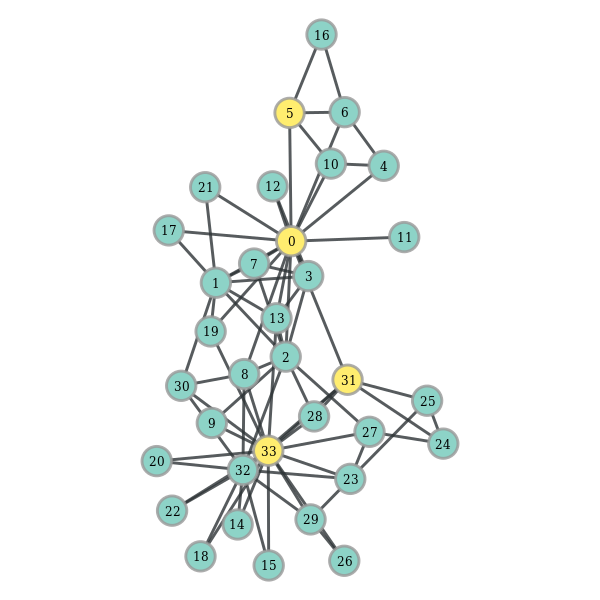

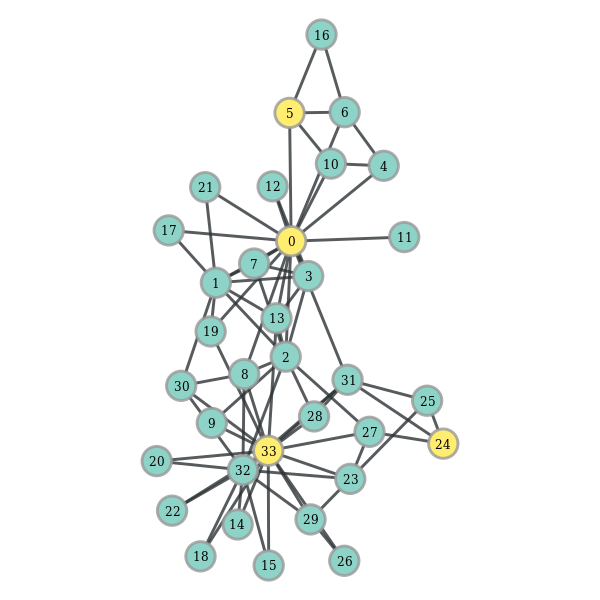

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
1490 1139
Optimised 343 ms
Starting Simple Greedy Algorithm
Greedy:  145 ms


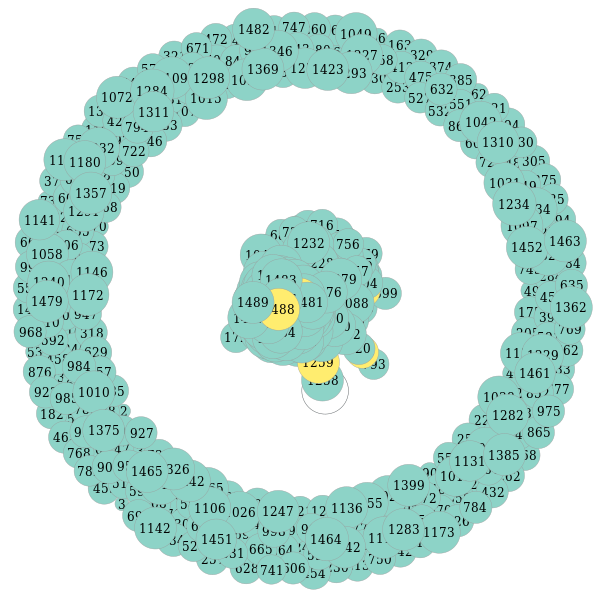

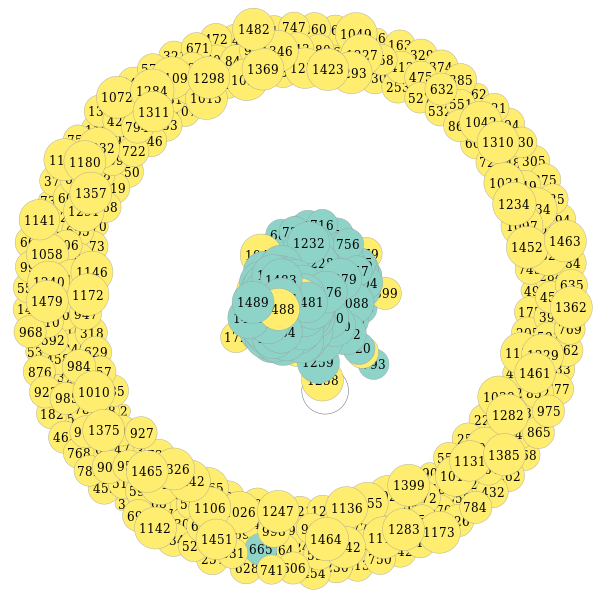

improvement %  19.731543624161073
Starting Optimised Algorithm
PREPROCESSED
4941 2527
Optimised 107063 ms
Starting Simple Greedy Algorithm
Greedy:  1889 ms


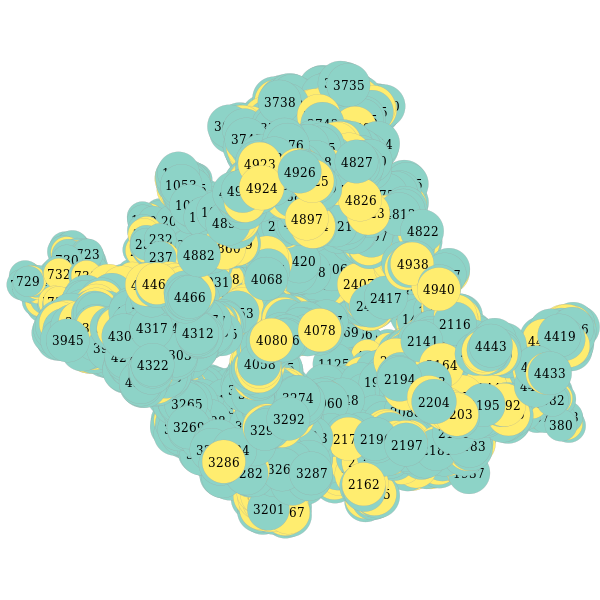

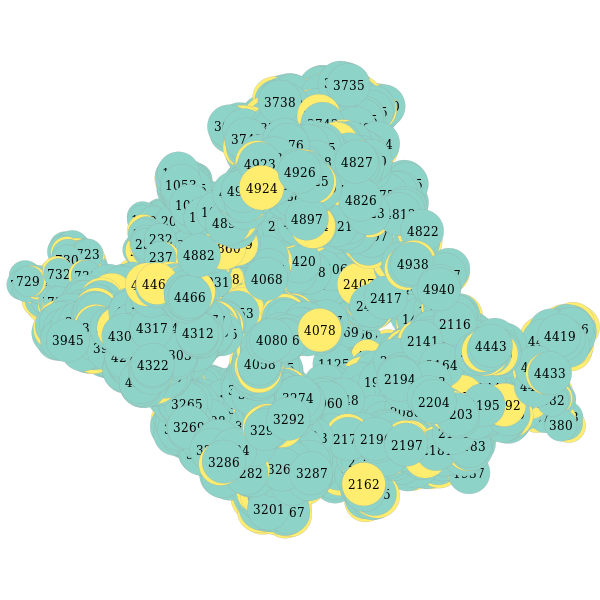

improvement %  -1.5988666261890305
Starting Optimised Algorithm
PREPROCESSED
62 43
Optimised 2 ms
Starting Simple Greedy Algorithm
Greedy:  2 ms


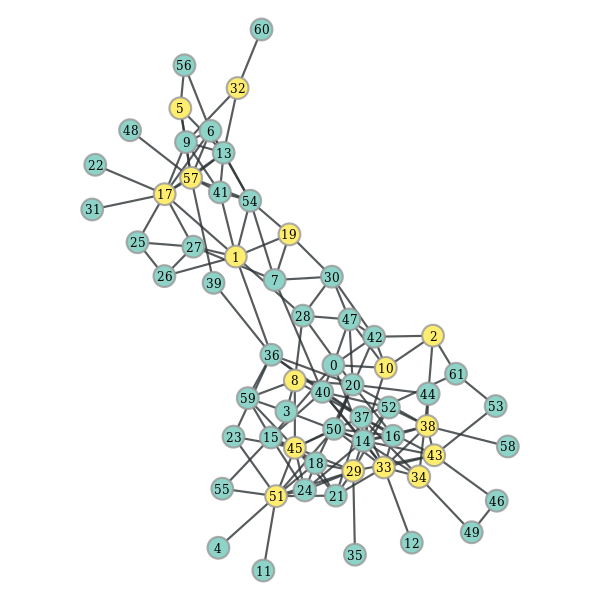

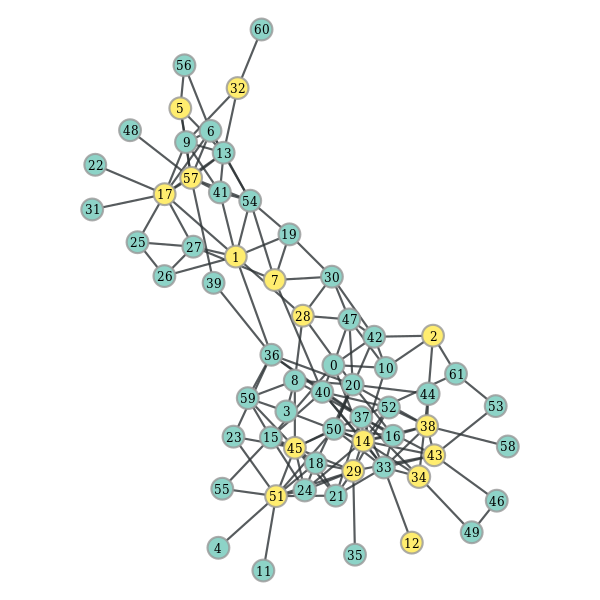

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
1589 295
Optimised 2654 ms
Starting Simple Greedy Algorithm
Greedy:  150 ms


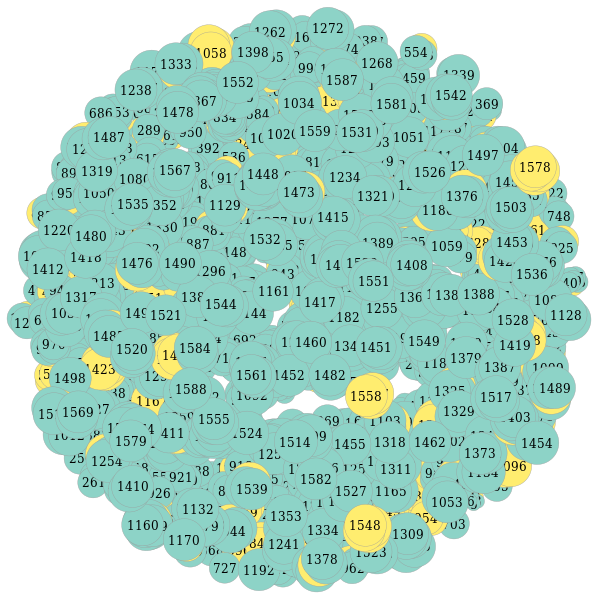

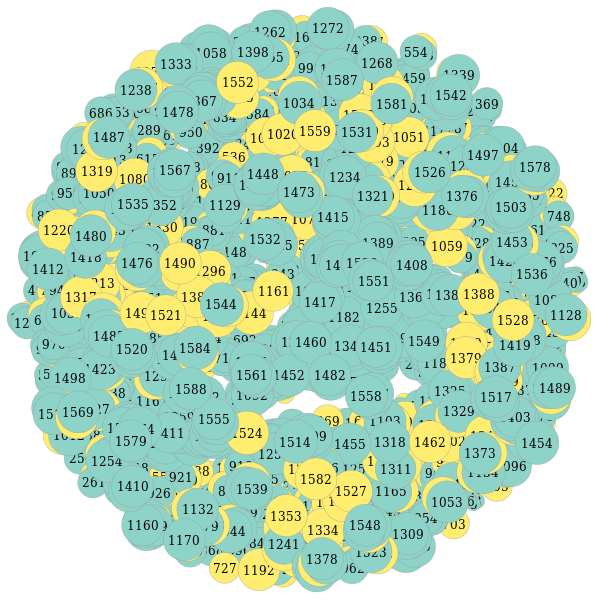

improvement %  8.244178728760227
Starting Optimised Algorithm
PREPROCESSED
115 115
Optimised 41 ms
Starting Simple Greedy Algorithm
Greedy:  5 ms


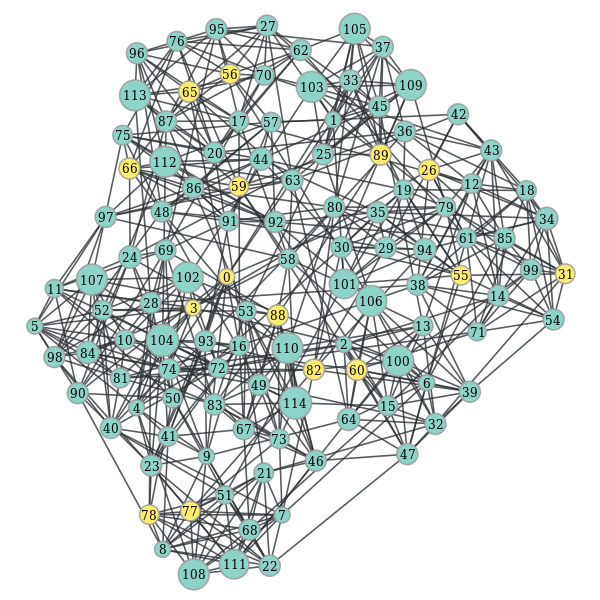

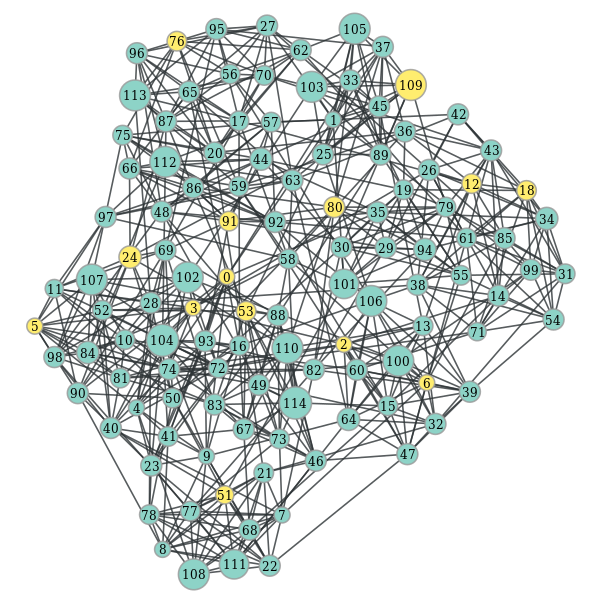

improvement %  -0.8695652173913043
Starting Optimised Algorithm
PREPROCESSED
105 81
Optimised 20 ms
Starting Simple Greedy Algorithm
Greedy:  4 ms


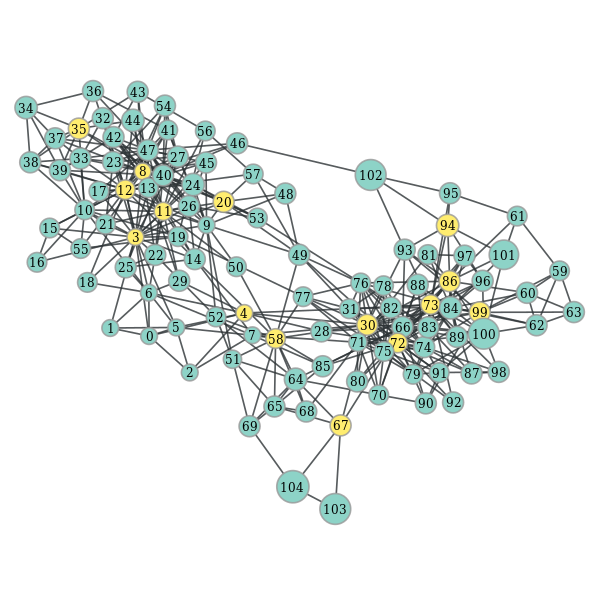

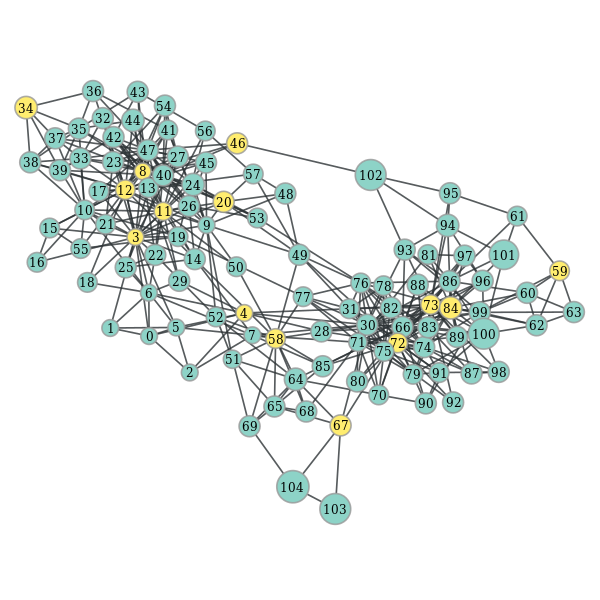

improvement %  -0.9523809523809523
Starting Optimised Algorithm
PREPROCESSED
297 246
Optimised 36 ms
Starting Simple Greedy Algorithm
Greedy:  14 ms


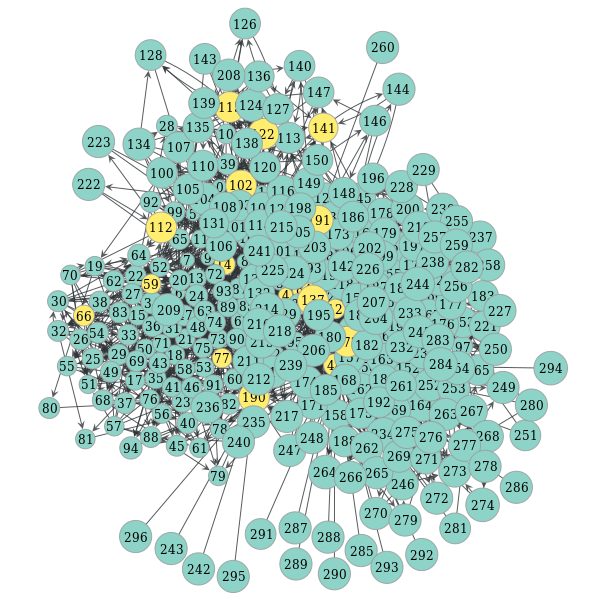

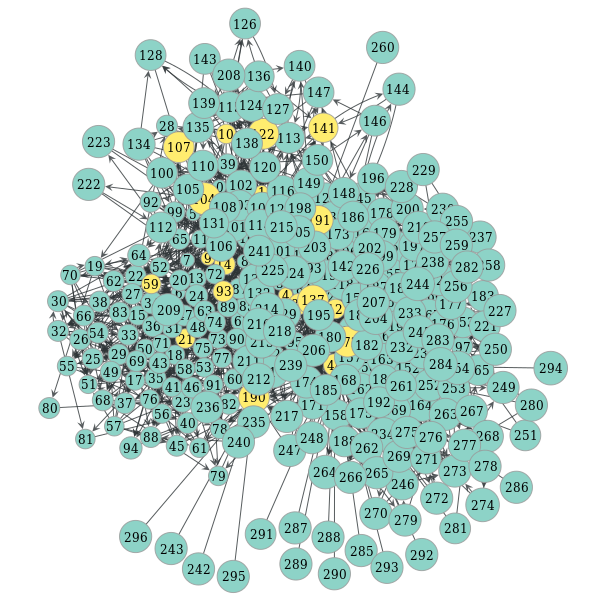

improvement %  0.6734006734006734
Starting Optimised Algorithm
PREPROCESSED
77 14
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  2 ms


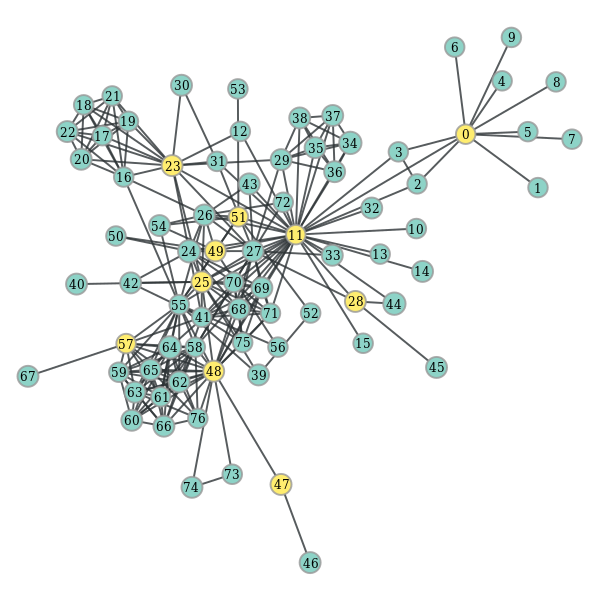

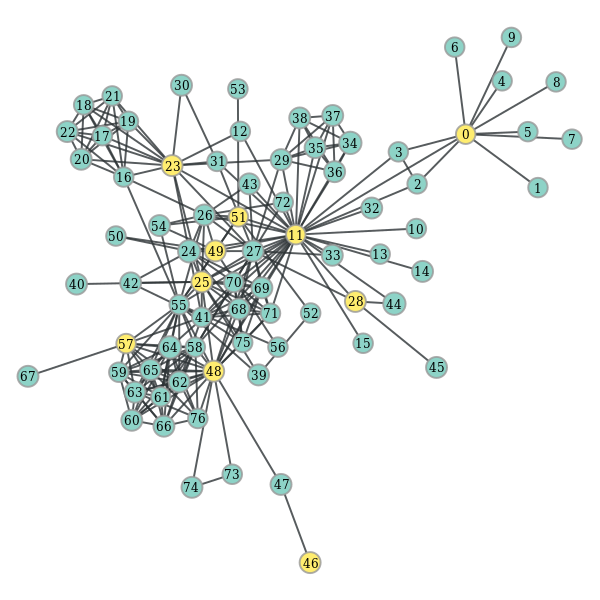

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
161 115
Optimised 2 ms
Starting Simple Greedy Algorithm
Greedy:  5 ms


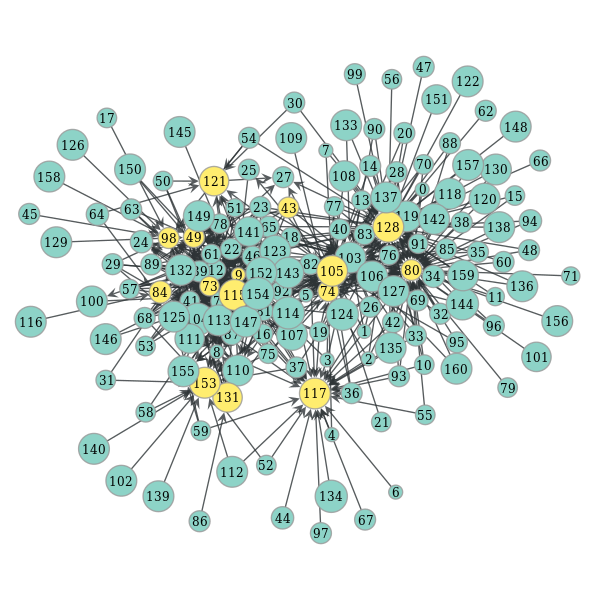

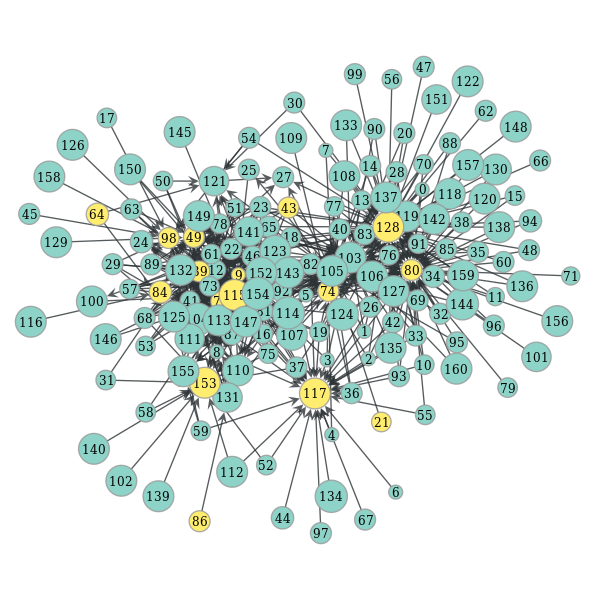

improvement %  0.6211180124223602
Starting Optimised Algorithm
PREPROCESSED
112 88
Optimised 3 ms
Starting Simple Greedy Algorithm
Greedy:  4 ms


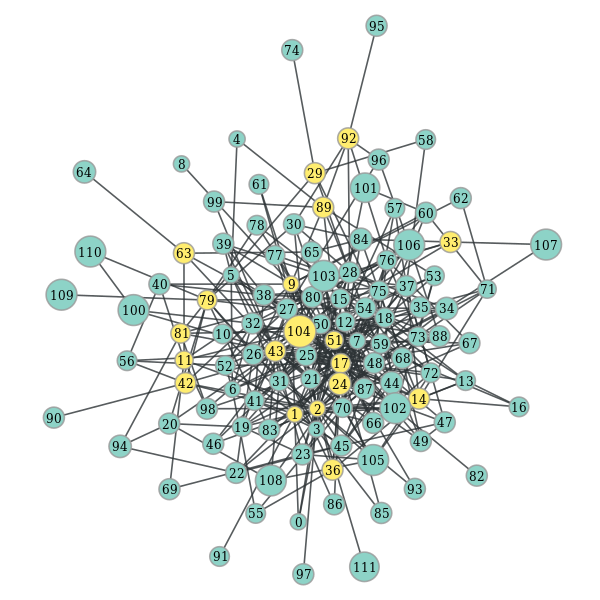

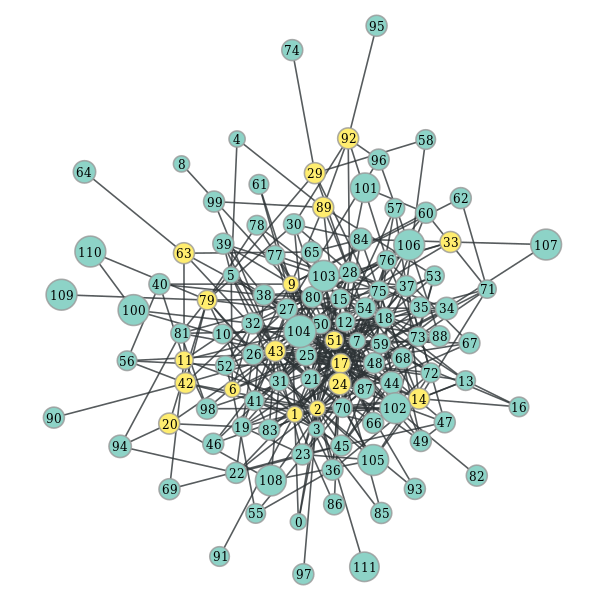

improvement %  -0.8928571428571429


In [91]:
for graph_k in gt.collection.data.keys():
    graph = gt.collection.data[graph_k]
    if len(list(graph.vertices())) > 5000:
        continue
    compare(graph)
# for graph_k in gt.collection.data.keys():
#     graph = gt.collection.data[graph_k]
#     compare(graph)
# for graph in custom:
#     compare(graph)

In [92]:
get_next = get_next_avg

Starting Optimised Algorithm
PREPROCESSED
200 160
Optimised 22 ms
Starting Simple Greedy Algorithm
Greedy:  8 ms


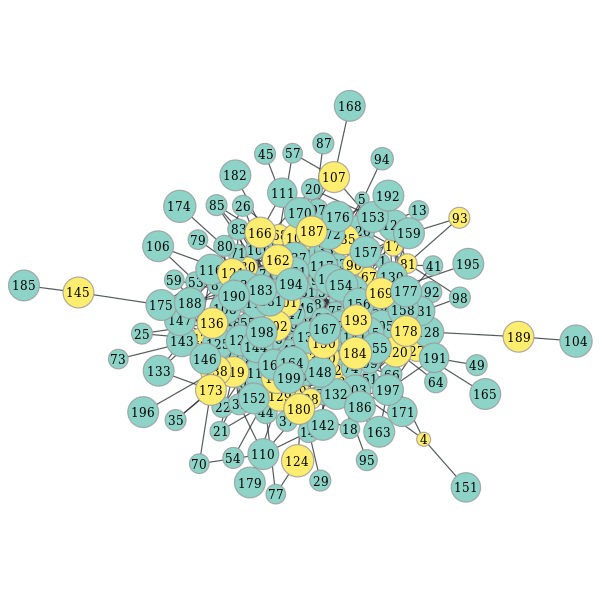

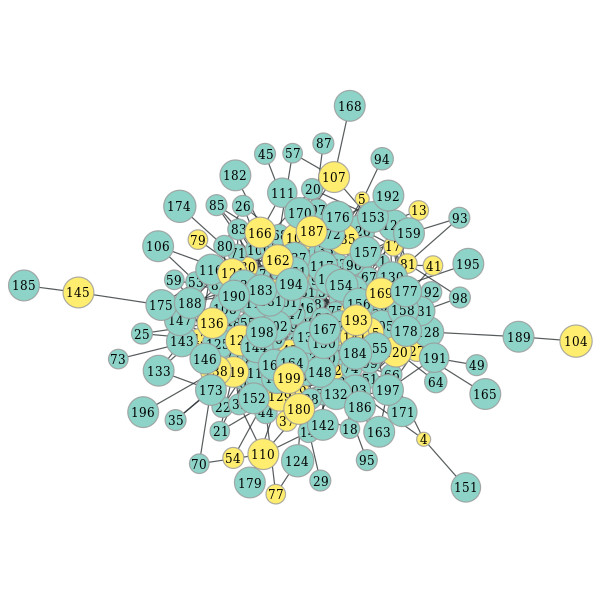

improvement %  1.0
Starting Optimised Algorithm
PREPROCESSED
100 81
Optimised 8 ms
Starting Simple Greedy Algorithm
Greedy:  3 ms


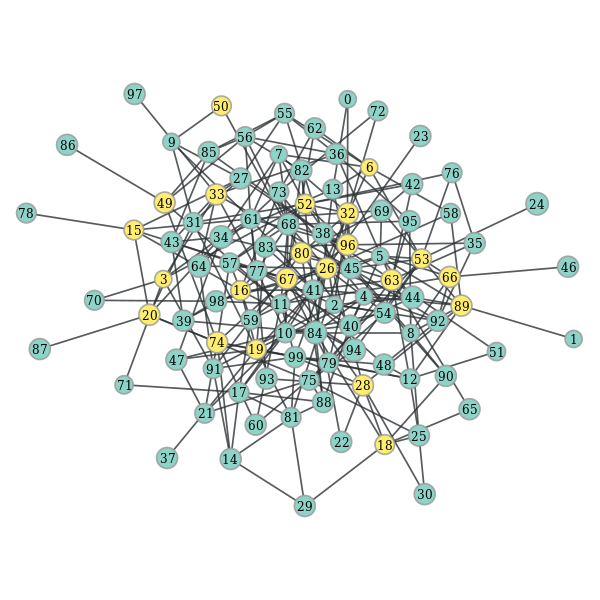

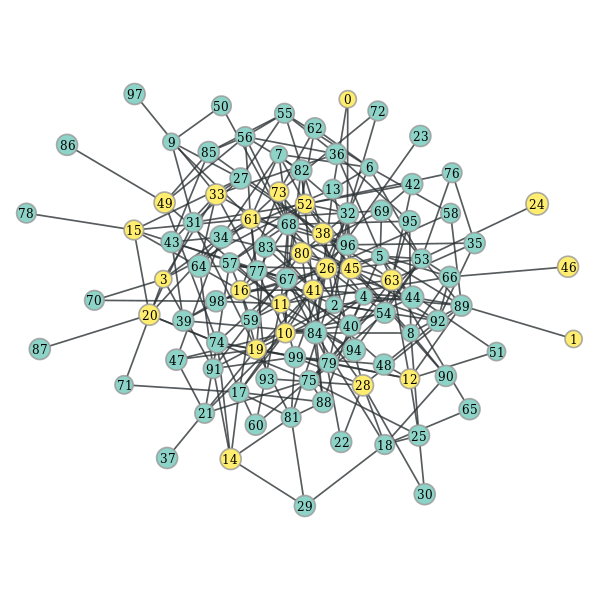

improvement %  3.0
Starting Optimised Algorithm
PREPROCESSED
1000 811
Optimised 2864 ms
Starting Simple Greedy Algorithm
Greedy:  95 ms


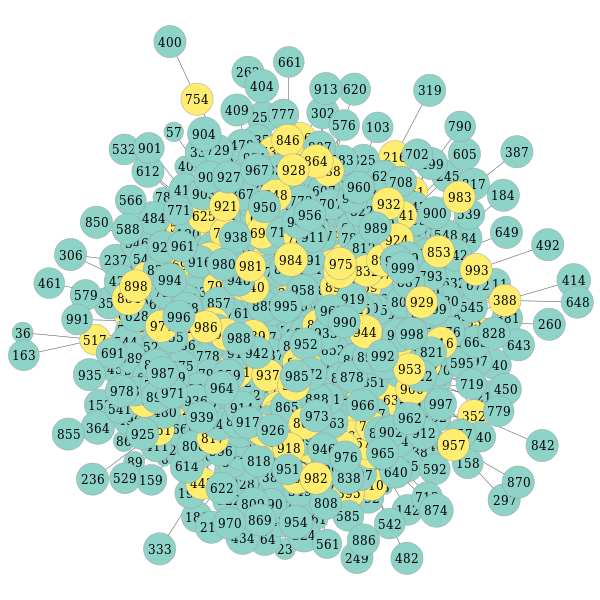

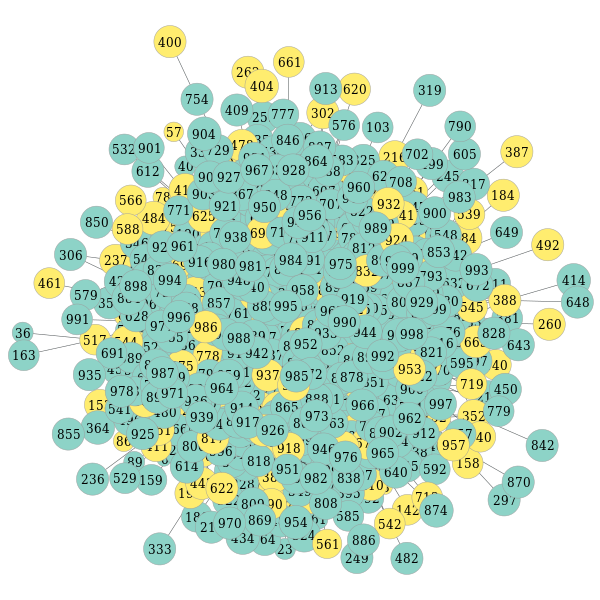

improvement %  0.6
Starting Optimised Algorithm
PREPROCESSED
500 398
Optimised 347 ms
Starting Simple Greedy Algorithm
Greedy:  31 ms


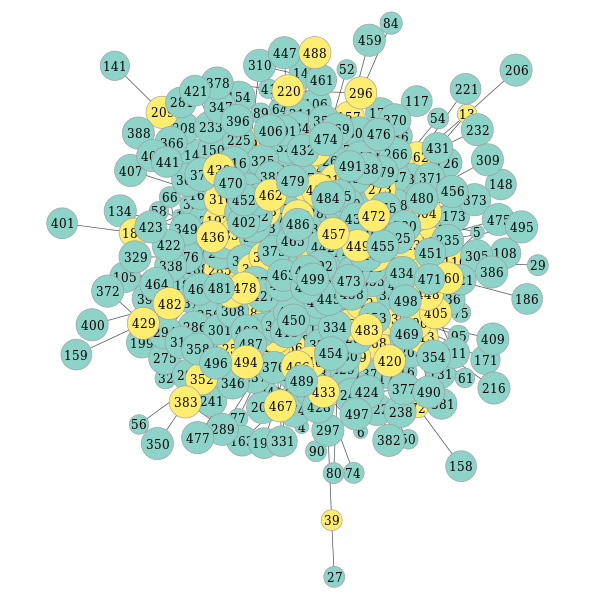

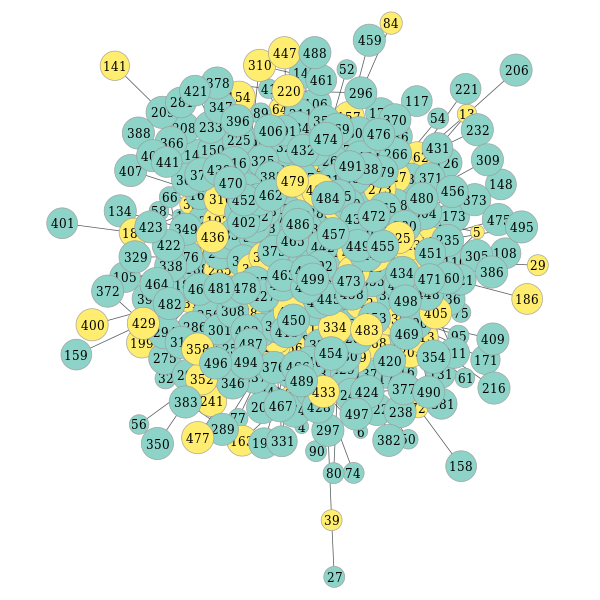

improvement %  0.6
Starting Optimised Algorithm
PREPROCESSED
2000 1627
Optimised 19905 ms
Starting Simple Greedy Algorithm
Greedy:  325 ms


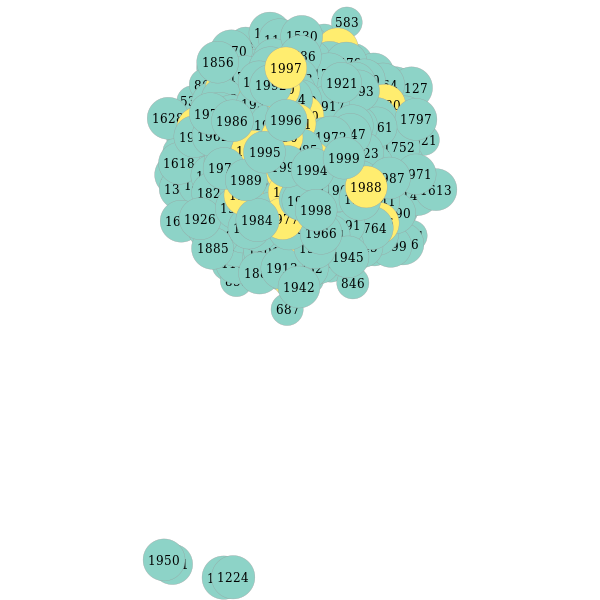

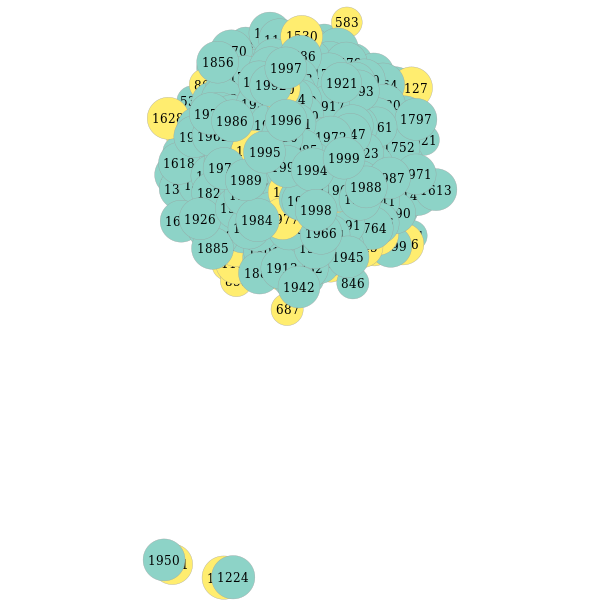

improvement %  1.9


In [93]:
# for graph_k in gt.collection.data.keys():
#     graph = gt.collection.data[graph_k]
#     compare(graph)
for graph in custom:
    compare(graph)

In [94]:
n = 20
m = 30
ak = int(2 * m / n) 
dm = 2 * m - ak * n 
g = graph_tool.generation.random_graph(n, lambda i: ak + 1 if i < dm else ak, directed=False, random=True) 
pos = gt.draw.sfdp_layout(g)

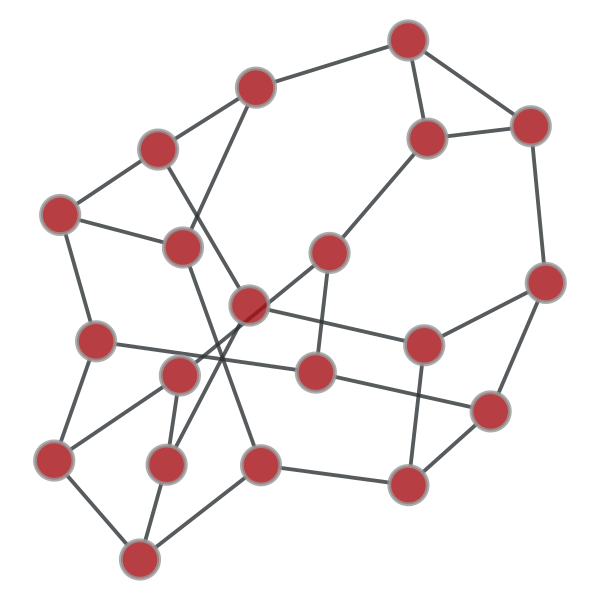

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fcddd526128, at 0x7fcddd526b38>

In [95]:
gt.draw.graph_draw(g, pos=pos)

Starting Optimised Algorithm
PREPROCESSED
20 20
Optimised 6 ms
Starting Simple Greedy Algorithm
Greedy:  2 ms


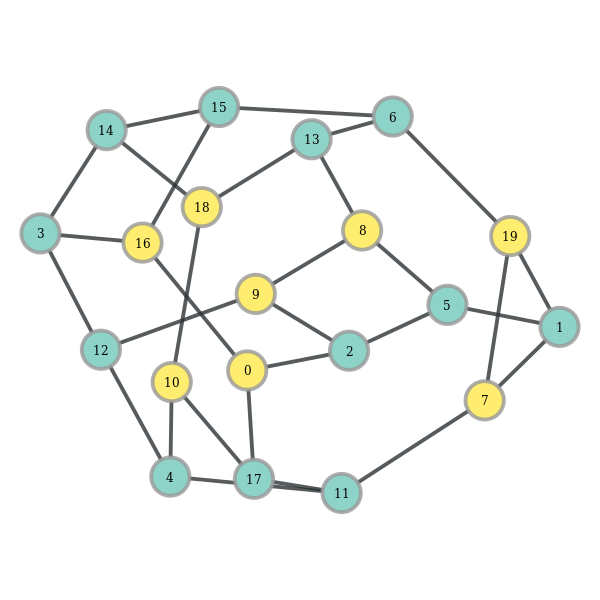

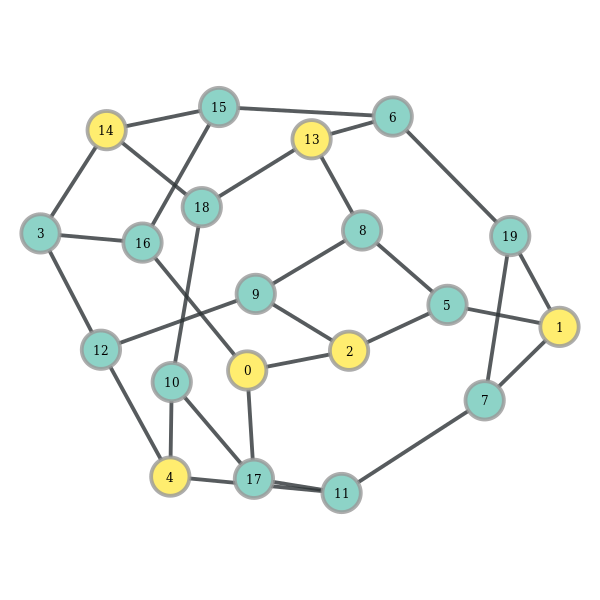

improvement %  -10.0


In [96]:
compare(g)

In [97]:
print(vertex_rules)

{}


Starting Optimised Algorithm
PREPROCESSED
2000 1627
Optimised 19750 ms
Starting Simple Greedy Algorithm
Greedy:  331 ms


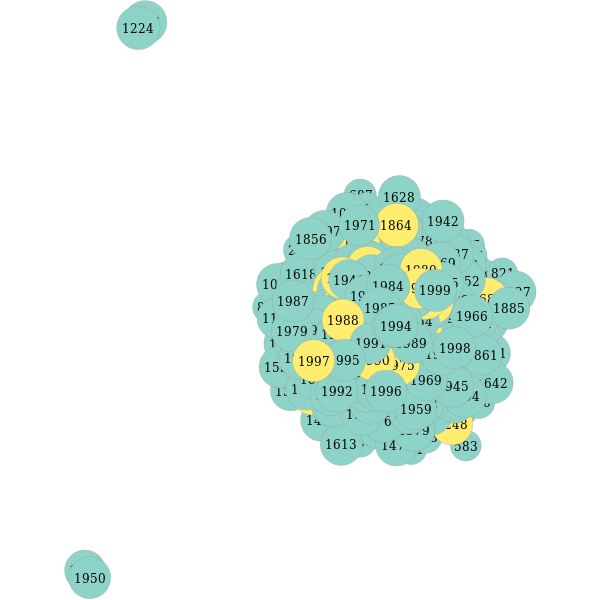

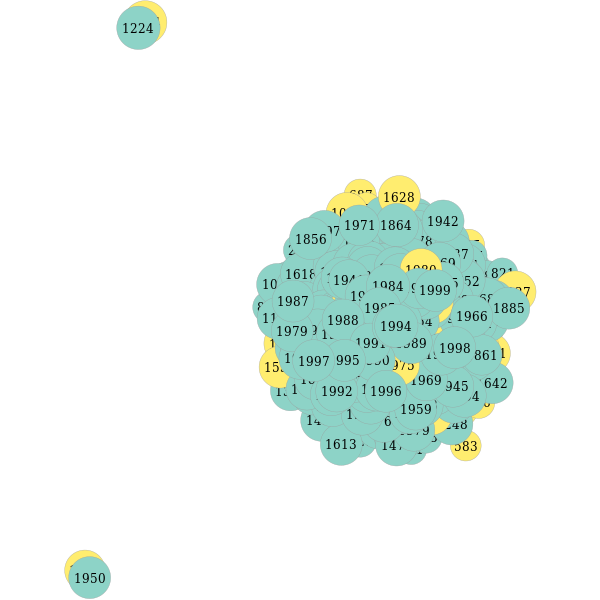

improvement %  1.9


In [98]:
compare(graph)

Starting Optimised Algorithm
PREPROCESSED
10 0
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  0 ms


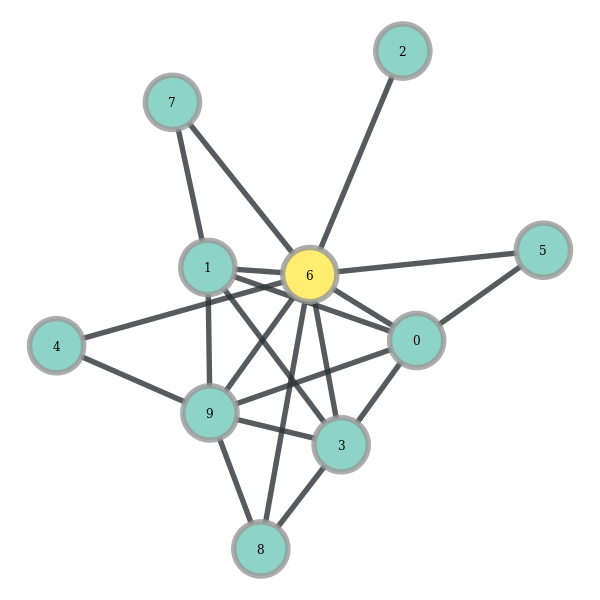

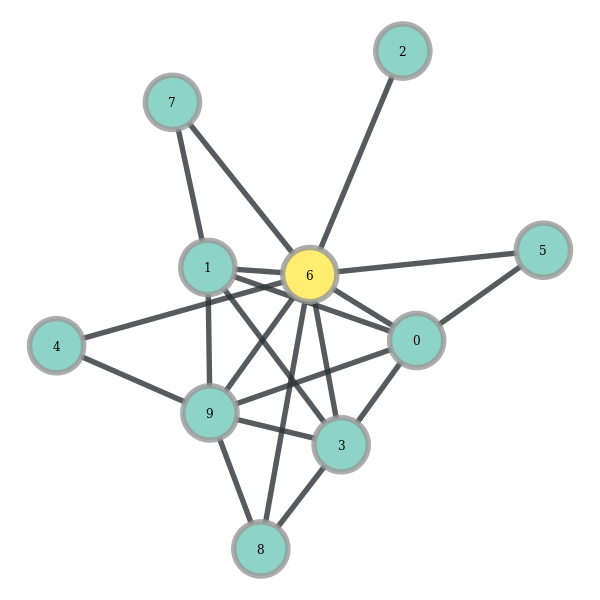

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
10 1
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  0 ms


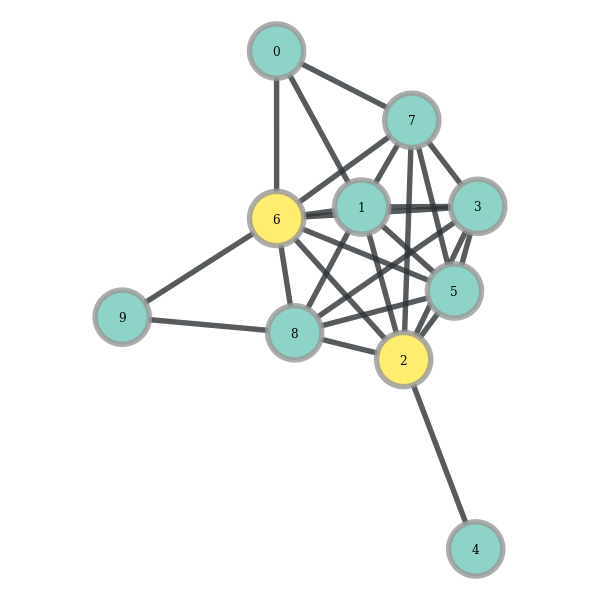

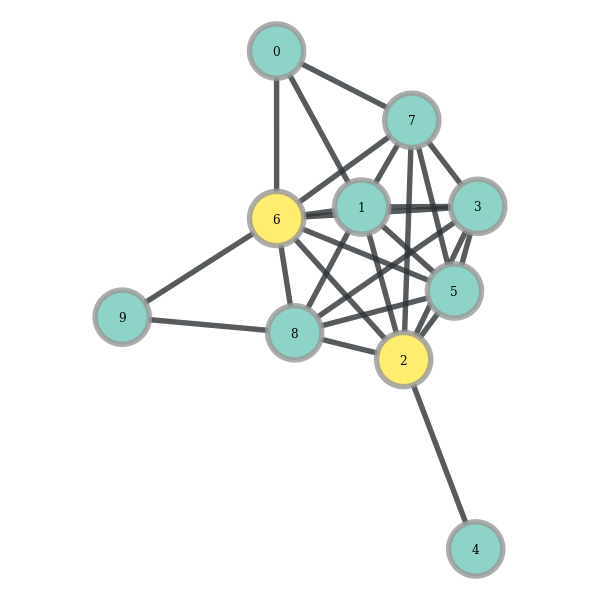

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
10 1
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  0 ms


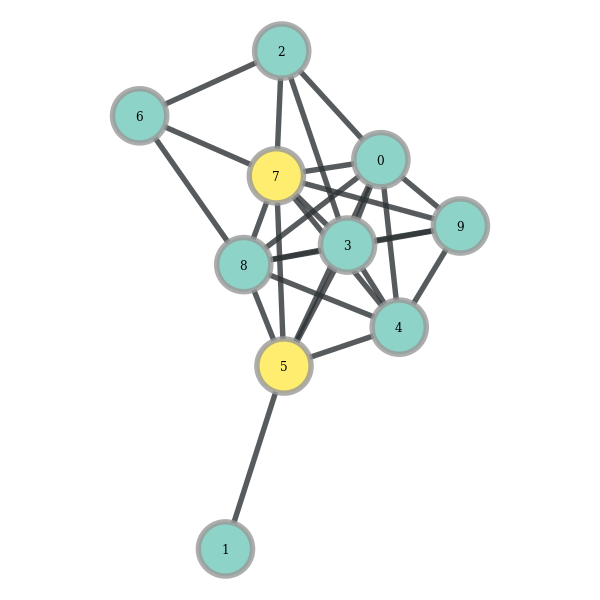

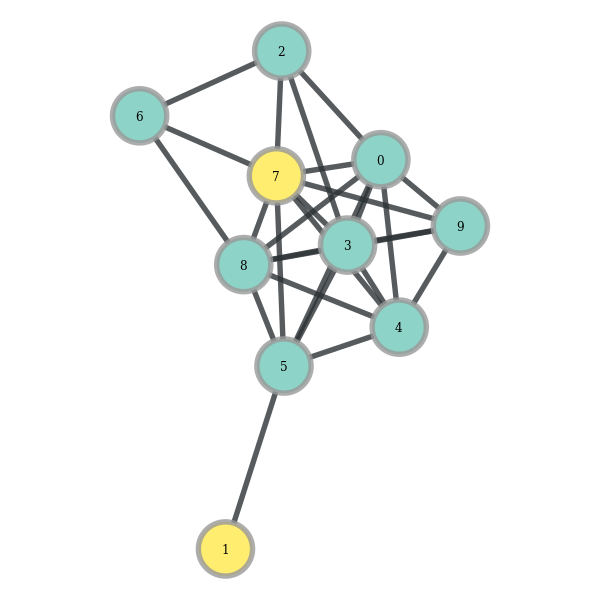

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
10 1
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  0 ms


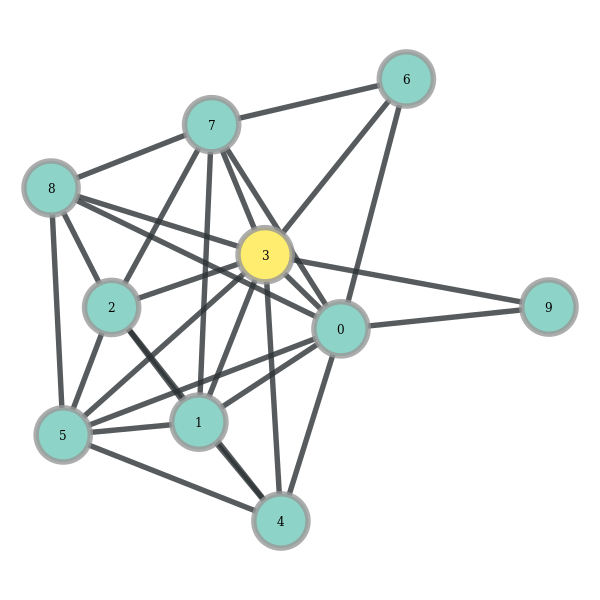

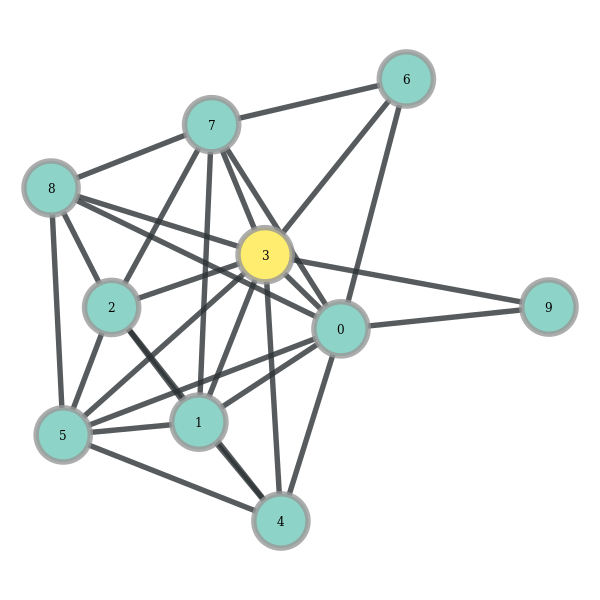

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
10 1
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  0 ms


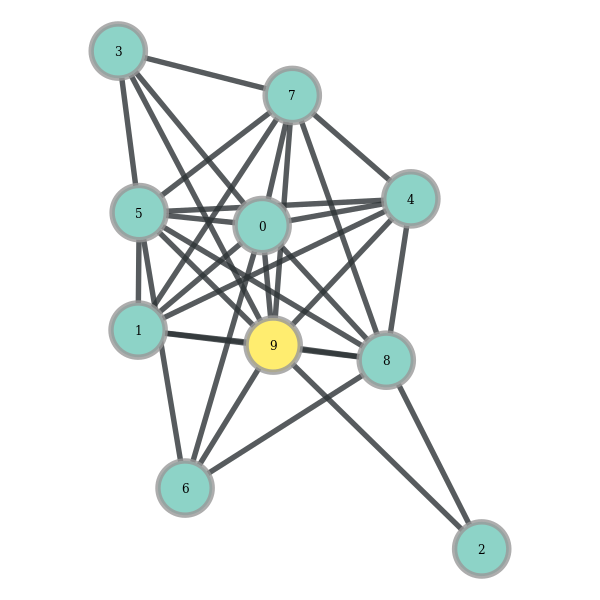

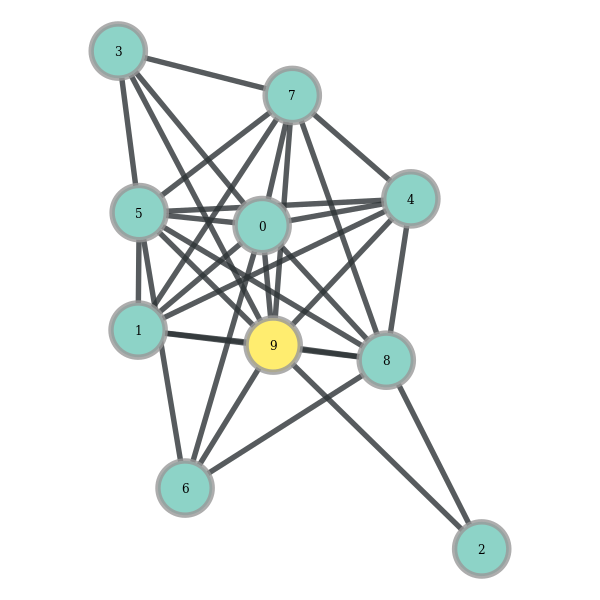

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
10 0
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  0 ms


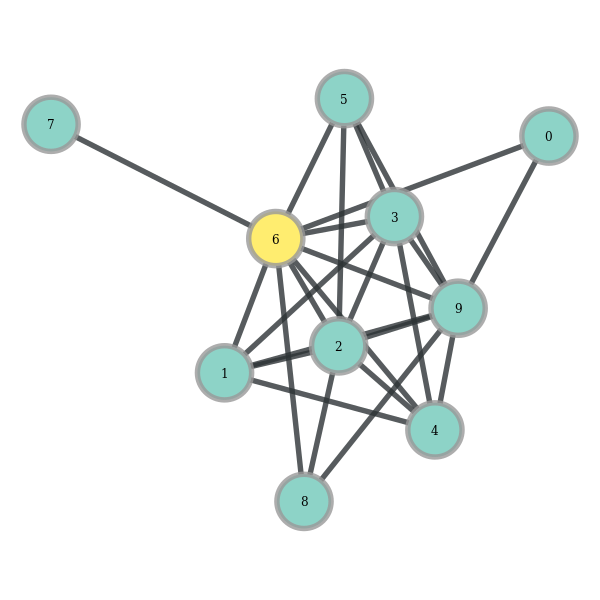

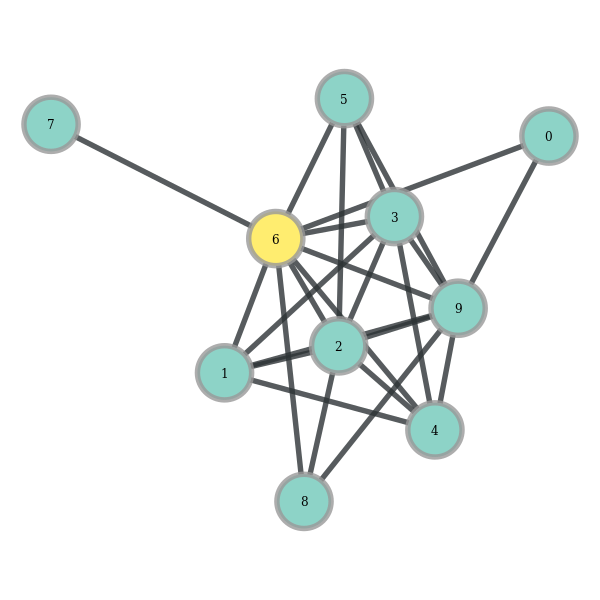

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
10 0
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  0 ms


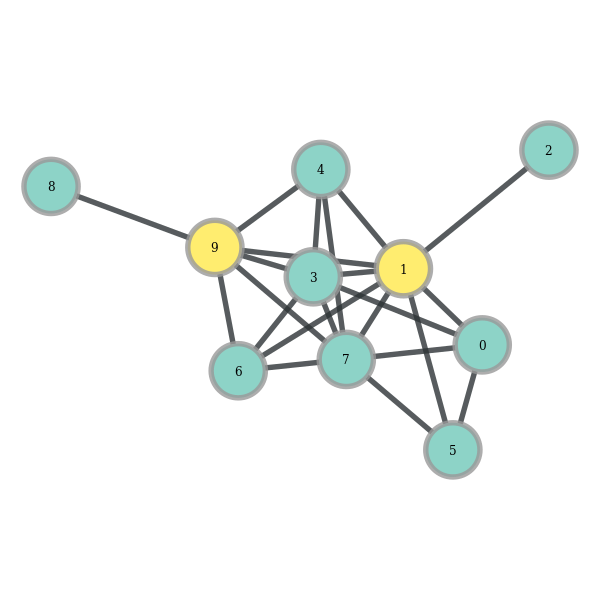

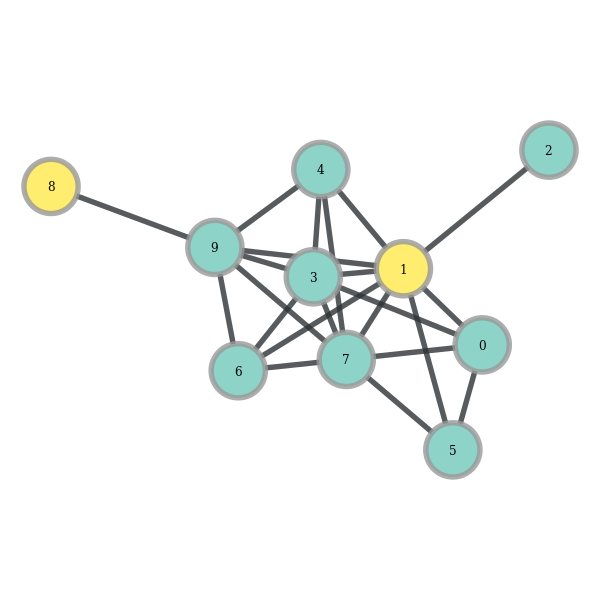

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
10 1
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  0 ms


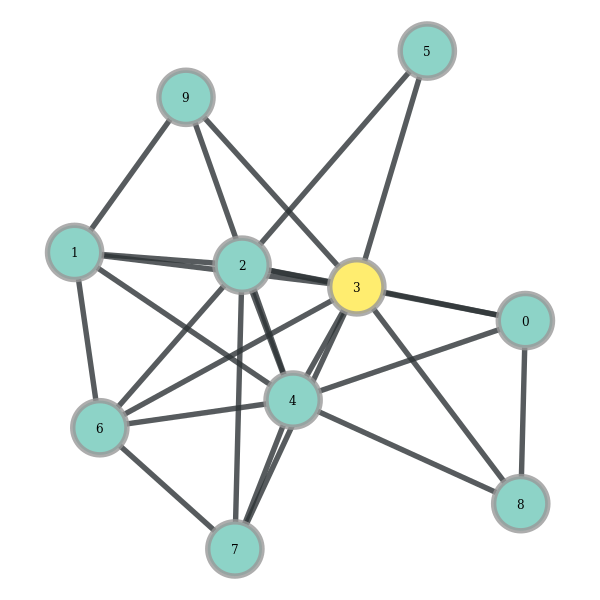

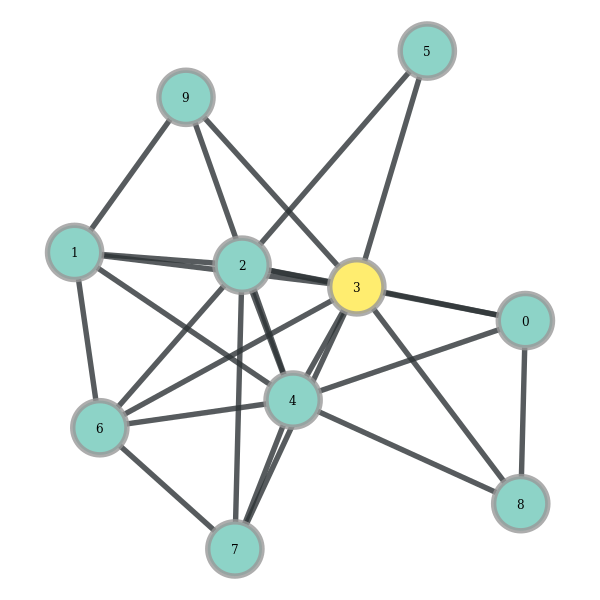

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
10 0
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  0 ms


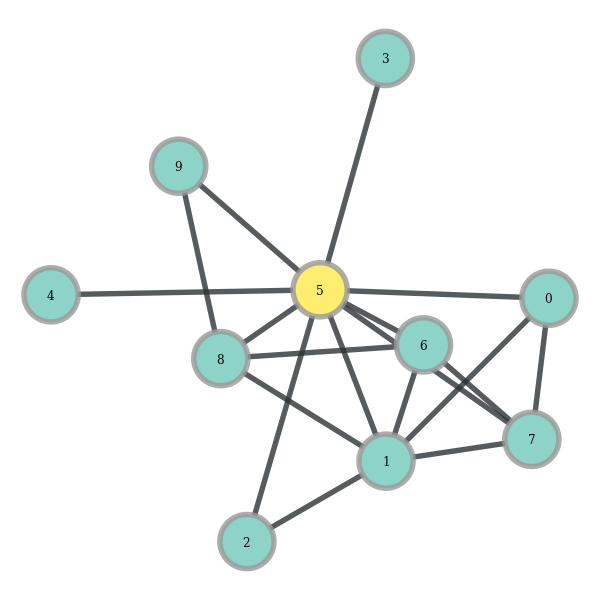

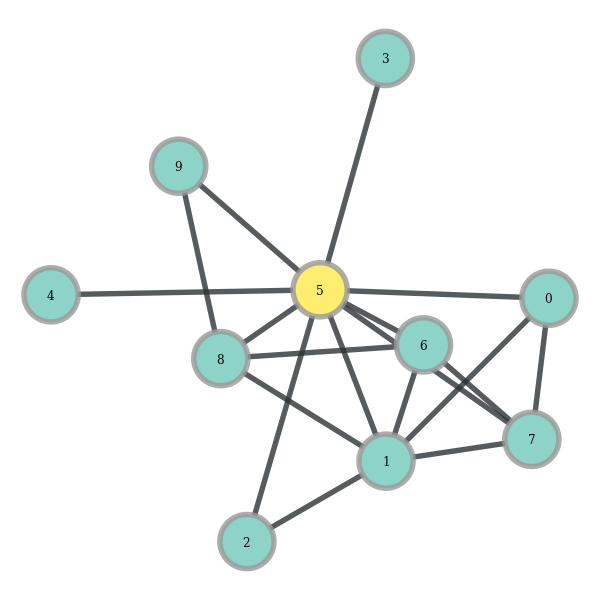

improvement %  0.0
Starting Optimised Algorithm
PREPROCESSED
10 4
Optimised 0 ms
Starting Simple Greedy Algorithm
Greedy:  0 ms


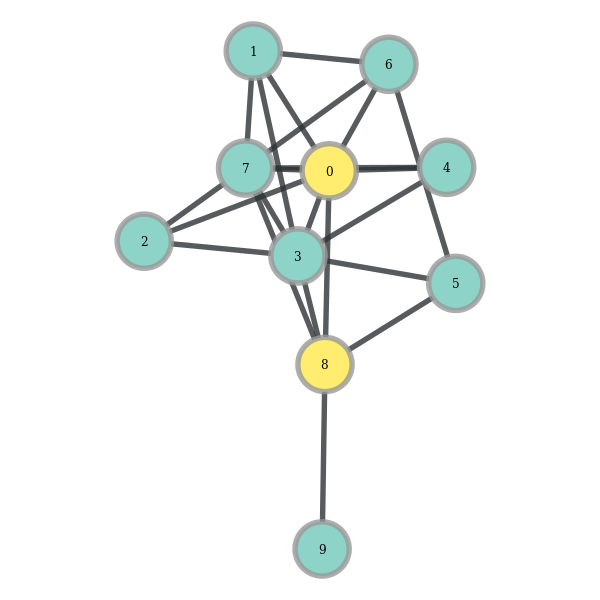

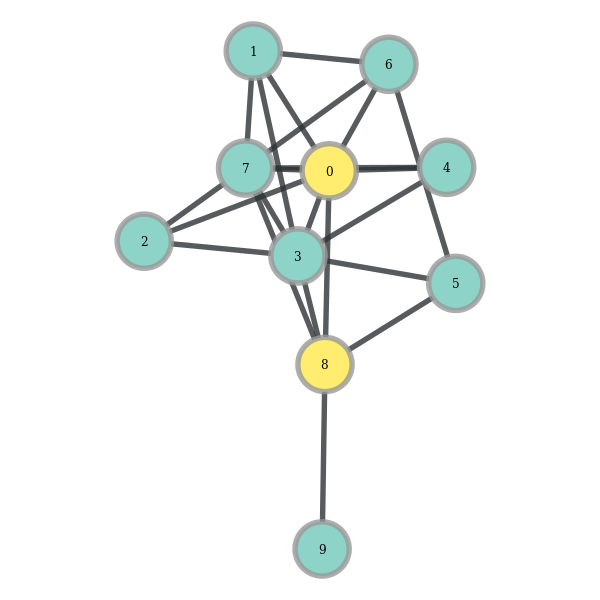

improvement %  0.0


In [99]:
sizes = [10]*10
for size in sizes:
    graph = gt.generation.random_graph(N=size, deg_sampler=random_degree_sampler, directed=False, verbose=True )
    compare(graph)

## Importing Graph Dataset

In [7]:
t_f = open("/home/achal/Downloads/Graph DataSets/gplus_combined.txt","r")

In [8]:
t_f

<_io.TextIOWrapper name='/home/achal/Downloads/Graph DataSets/gplus_combined.txt' mode='r' encoding='UTF-8'>

In [9]:
lines = [[int(n) for n in x.split()] for x in t_f.readlines()]
#closes the file
t_f.close()

In [10]:
len(lines)

30494866

In [11]:
counter = 0
def get_counter():
    global counter 
    counter +=1 
    return counter

In [12]:
mapping = {}
mod_lines = []
for v1,v2 in tqdm(lines):
    
    if v1 in mapping:
        v11 = mapping[v1]
    else:
        v11 = get_counter()
        mapping[v1] = v11
    
    if v2 in mapping:
        v22 = mapping[v2]
    else:
        v22 = get_counter()
        mapping[v2] = v22
        
    mod_lines.append([v11,v22])

In [13]:
g_plus= gt.Graph()

In [14]:
len(mapping)

107614

In [15]:
g_plus.add_edge_list(mod_lines)

In [ ]:
gt.draw.graph_draw(g_plus)

In [45]:
import sys

In [51]:
sys.getsizeof(list(g_plus.edges()))

251133496

In [81]:
for graph_k in list(gt.collection.data.keys()):
    graph = gt.collection.data[graph_k]
#     if len(list(graph.vertices())) >5000:
#         continue
    a = min_dominating_set_h1(graph)
#     print(len(a))
    b = helper_algo(graph, min_dominating_set_greedy_reverse)
    print("----")
#     print(len)

Size: 18
Size: 33
----
Size: 2029
Size: 15561
----
Size: 3024
Size: 5135
----
Size: 19
Size: 297
----
Size: 3452
Size: 5575
----
Size: 5516
Size: 9903
----
Size: 6655
Size: 12769
----
Size: 16
Size: 17
----
Size: 3093
Size: 17146
----
Size: 14
Size: 17
----
Size: 2643
Size: 3722
----
Size: 4
Size: 9
----
Size: 10
Size: 21
----
Size: 477
Size: 596
----
Size: 7676
Size: 39795
----
Size: 396
Size: 1490
----
Size: 14
Size: 19
----
Size: 1562
Size: 1935
----
Size: 16
Size: 160
----


In [72]:
gt.collection.data.values()

dict_values([<Graph object, undirected, with 115 vertices and 613 edges at 0x131dfbef0>, <Graph object, undirected, with 112 vertices and 425 edges at 0x10ee63f60>, <Graph object, undirected, with 22963 vertices and 48436 edges at 0x10ee63438>, <Graph object, undirected, with 16706 vertices and 121251 edges at 0x10dedd400>, <Graph object, directed, with 297 vertices and 2359 edges at 0x10dedd550>, <Graph object, undirected, with 16726 vertices and 47594 edges at 0x10ee590f0>, <Graph object, undirected, with 31163 vertices and 120029 edges at 0x10ee59470>, <Graph object, undirected, with 40421 vertices and 175693 edges at 0x10ee597f0>, <Graph object, undirected, with 62 vertices and 159 edges at 0x10ee59b70>, <Graph object, undirected, with 36692 vertices and 183831 edges at 0x10ee59ef0>, <Graph object, undirected, with 8361 vertices and 15751 edges at 0x10ee67240>, <Graph object, undirected, with 34 vertices and 78 edges at 0x10ee63cc0>, <Graph object, undirected, with 77 vertices and 

In [118]:
for graph_k in list(gt.collection.data.keys()):
    graph = gt.collection.data[graph_k]
    if len(list(graph.vertices())) >1000:
        continue
    a = min_dominating_set_h1(graph)
#     print(len(a))
    b = helper_algo(graph, min_dominating_set_greedy_reverse)
    c = helper_algo(graph, min_dominating_set_greedy_vote)
    pd, tbd, dmap = run_preprocess(graph)
    map_p = run(graph, pd, tbd, dmap)
    print("Size:",len(map_p))
    print("----")
#     print(len)

Size: 18
Size: 33
Size: 51
Size: 10
----
Size: 19
Size: 297
Size: 162
Size: 14
----
Size: 16
Size: 17
Size: 33
Size: 9
----
Size: 14
Size: 17
Size: 57
Size: 15
----
Size: 4
Size: 9
Size: 11
Size: 3
----
Size: 10
Size: 21
Size: 25
Size: 3
----
Size: 14
Size: 19
Size: 58
Size: 15
----
Size: 16
Size: 160
Size: 62
Size: 4
----
